# Project developed by:
- Tomás Zúquete da Fonseca
- delivery date: 26/07/2021
- email: t.zuquete.f@gmail.com
- phone Number: +351 9125977740

In [0]:
import pyspark
from pyspark.sql.functions import *
from pyspark.sql import SparkSession
from pyspark.sql.window import Window
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm
from pyspark.ml.evaluation import BinaryClassificationEvaluator
from sklearn.metrics import classification_report, confusion_matrix
from pyspark.ml.classification import DecisionTreeClassifier,GBTClassifier,RandomForestClassifier
from pyspark.ml import Pipeline
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.stat import Correlation

In [0]:
# May take a little while on a local computer
spark = SparkSession.builder.appName("Basics").getOrCreate()

In [0]:
# File location and type
file_location = "/FileStore/tables/rfqs.csv"
file_type = "csv"

# Use the Spark CSV datasource with options specifying:
# - First line of file is a header
# - Automatically infer the schema of the data

# CSV options
infer_schema = "false"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
df_RfQ  = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

df_RfQ.cache() # Cache data for faster reuse
display(df_RfQ)

_c0,date_time,instrument,client,price,mid,vol_MM,dv01,num_dealers,side,won
94075,2019-01-25 15:58:29.0,I,F,112.779,112.7416,2.0,6.087,5,-1,0
94087,2019-01-28 09:28:10.0,B,G,106.065,106.1855,0.5,21.9017,5,1,0
94089,2019-01-28 09:40:24.0,F,G,107.607,107.557,0.975,13.2621,5,-1,0
94158,2019-01-29 16:21:06.0,E,F,100.622,100.582,0.01,4.4853,5,-1,0
94194,2019-01-30 16:19:28.0,F,F,107.297,107.217,0.448,13.2087,5,-1,0
94244,2019-01-31 16:20:59.0,F,F,108.102,107.942,0.59,13.3072,5,-1,0
94329,2019-02-05 16:21:31.0,F,F,107.136,107.056,0.037,13.1736,5,-1,0
94492,2019-02-13 12:24:09.0,F,F,107.13,107.0595,0.12,13.1565,5,-1,0
96928,2019-02-18 16:24:28.0,C,G,101.014,101.027,10.0,9.5187,3,1,0
96973,2019-02-20 13:25:21.0,C,G,101.297,101.3064,10.0,9.5442,4,1,1


In [0]:
df_RfQ.printSchema()
df_RfQ.take(3)

root
-- _c0: string (nullable = true)
-- date_time: string (nullable = true)
-- instrument: string (nullable = true)
-- client: string (nullable = true)
-- price: string (nullable = true)
-- mid: string (nullable = true)
-- vol_MM: string (nullable = true)
-- dv01: string (nullable = true)
-- num_dealers: string (nullable = true)
-- side: string (nullable = true)
-- won: string (nullable = true)

Out[4]: [Row(_c0='94075', date_time='2019-01-25 15:58:29.0', instrument='I', client='F', price='112.779', mid='112.7416', vol_MM='2.0', dv01='6.087', num_dealers='5', side='-1', won='0'),
 Row(_c0='94087', date_time='2019-01-28 09:28:10.0', instrument='B', client='G', price='106.065', mid='106.1855', vol_MM='0.5', dv01='21.9017', num_dealers='5', side='1', won='0'),
 Row(_c0='94089', date_time='2019-01-28 09:40:24.0', instrument='F', client='G', price='107.607', mid='107.557', vol_MM='0.975', dv01='13.2621', num_dealers='5', side='-1', won='0')]

In [0]:
df_RfQ2 = df_RfQ
df_RfQ2 = df_RfQ2.drop('_c0')
df_RfQ2 = df_RfQ2.withColumn("date_time",to_timestamp("date_time")) \
                 .withColumn("date",to_date("date_time")) \
                 .withColumn("hour", hour(col("date_time")))\
                 .withColumn("dayOfWeek", dayofweek('date_time'))\
                 .withColumn("dayOfMonth", dayofmonth('date_time'))\
                 .withColumn("price", df_RfQ.price.cast("float"))\
                 .withColumn("mid", df_RfQ.mid.cast("float"))\
                 .withColumn("vol_MM", df_RfQ.vol_MM.cast("float"))\
                 .withColumn("dv01", df_RfQ.dv01.cast("double"))\
                 .withColumn("num_dealers", df_RfQ.num_dealers.cast("integer"))\
                 .withColumn("side", df_RfQ.side.cast("integer"))\
                 .withColumn("won", df_RfQ.won.cast("integer"))
df_RfQ2.printSchema()
display(df_RfQ2)

root
-- date_time: timestamp (nullable = true)
-- instrument: string (nullable = true)
-- client: string (nullable = true)
-- price: float (nullable = true)
-- mid: float (nullable = true)
-- vol_MM: float (nullable = true)
-- dv01: double (nullable = true)
-- num_dealers: integer (nullable = true)
-- side: integer (nullable = true)
-- won: integer (nullable = true)
-- date: date (nullable = true)
-- hour: integer (nullable = true)
-- dayOfWeek: integer (nullable = true)
-- dayOfMonth: integer (nullable = true)

date_time,instrument,client,price,mid,vol_MM,dv01,num_dealers,side,won,date,hour,dayOfWeek,dayOfMonth
2019-01-25T15:58:29.000+0000,I,F,112.779,112.7416,2.0,6.087,5,-1,0,2019-01-25,15,6,25
2019-01-28T09:28:10.000+0000,B,G,106.065,106.1855,0.5,21.9017,5,1,0,2019-01-28,9,2,28
2019-01-28T09:40:24.000+0000,F,G,107.607,107.557,0.975,13.2621,5,-1,0,2019-01-28,9,2,28
2019-01-29T16:21:06.000+0000,E,F,100.622,100.582,0.01,4.4853,5,-1,0,2019-01-29,16,3,29
2019-01-30T16:19:28.000+0000,F,F,107.297,107.217,0.448,13.2087,5,-1,0,2019-01-30,16,4,30
2019-01-31T16:20:59.000+0000,F,F,108.102,107.942,0.59,13.3072,5,-1,0,2019-01-31,16,5,31
2019-02-05T16:21:31.000+0000,F,F,107.136,107.056,0.037,13.1736,5,-1,0,2019-02-05,16,3,5
2019-02-13T12:24:09.000+0000,F,F,107.13,107.0595,0.12,13.1565,5,-1,0,2019-02-13,12,4,13
2019-02-18T16:24:28.000+0000,C,G,101.014,101.027,10.0,9.5187,3,1,0,2019-02-18,16,2,18
2019-02-20T13:25:21.000+0000,C,G,101.297,101.3064,10.0,9.5442,4,1,1,2019-02-20,13,4,20


#### Now we can start to add new features based on the quoted spread
* For a buy: mid - price
* For a sell: price - mid

I will use the last "mid", from dataset B "mids.csv", before date_time from dataset A to avoid leakege information.

In [0]:
# File location and type
file_location = "/FileStore/tables/mids.csv"
file_type = "csv"

# Use the Spark CSV datasource with options specifying:
# - First line of file is a header
# - Automatically infer the schema of the data

# CSV options
infer_schema = "false"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
df_Mids  = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

df_Mids.cache() # Cache data for faster reuse
display(df_Mids)

_c0,date_time,mid,instrument
0,2019-01-25 07:09:59,107.758,H
1,2019-01-25 07:14:59,107.757,H
2,2019-01-25 07:19:58,107.755,H
3,2019-01-25 07:24:59,107.756,H
4,2019-01-25 07:29:59,125.28,K
5,2019-01-25 07:34:59,101.429,A
6,2019-01-25 07:39:59,125.328,K
7,2019-01-25 07:44:59,107.81,H
8,2019-01-25 07:49:59,101.437,A
9,2019-01-25 07:54:59,107.795,H


In [0]:
df_Mids.printSchema()

root
-- _c0: string (nullable = true)
-- date_time: string (nullable = true)
-- mid: string (nullable = true)
-- instrument: string (nullable = true)

In [0]:
# I can start by removing column "_c0" and cast the 'date_time' and mid 'columns'
df_Mids2 = df_Mids
df_Mids2 = df_Mids2.drop('_c0')
df_Mids2 = df_Mids2.withColumn("date_time",to_timestamp("date_time")) \
                 .withColumn("date",to_date("date_time")) \
                 .withColumn("hour", hour(col("date_time")))\
                 .withColumn("dayOfWeek", dayofweek('date_time'))\
                 .withColumn("dayOfMonth", dayofmonth('date_time'))\
                 .withColumn("mid", df_Mids.mid.cast("float"))
df_Mids2.printSchema()
display(df_Mids2)

root
-- date_time: timestamp (nullable = true)
-- mid: float (nullable = true)
-- instrument: string (nullable = true)
-- date: date (nullable = true)
-- hour: integer (nullable = true)
-- dayOfWeek: integer (nullable = true)
-- dayOfMonth: integer (nullable = true)

date_time,mid,instrument,date,hour,dayOfWeek,dayOfMonth
2019-01-25T07:09:59.000+0000,107.758,H,2019-01-25,7,6,25
2019-01-25T07:14:59.000+0000,107.757,H,2019-01-25,7,6,25
2019-01-25T07:19:58.000+0000,107.755,H,2019-01-25,7,6,25
2019-01-25T07:24:59.000+0000,107.756,H,2019-01-25,7,6,25
2019-01-25T07:29:59.000+0000,125.28,K,2019-01-25,7,6,25
2019-01-25T07:34:59.000+0000,101.429,A,2019-01-25,7,6,25
2019-01-25T07:39:59.000+0000,125.328,K,2019-01-25,7,6,25
2019-01-25T07:44:59.000+0000,107.81,H,2019-01-25,7,6,25
2019-01-25T07:49:59.000+0000,101.437,A,2019-01-25,7,6,25
2019-01-25T07:54:59.000+0000,107.795,H,2019-01-25,7,6,25


In [0]:
display(df_Mids2.select('date_time').distinct().orderBy('date_time'))
# we can see that the time of the priced bond is displayed with a frequency of 5 min.

date_time
2019-01-25T07:09:59.000+0000
2019-01-25T07:14:59.000+0000
2019-01-25T07:19:58.000+0000
2019-01-25T07:24:59.000+0000
2019-01-25T07:29:59.000+0000
2019-01-25T07:34:59.000+0000
2019-01-25T07:39:59.000+0000
2019-01-25T07:44:59.000+0000
2019-01-25T07:49:59.000+0000
2019-01-25T07:54:59.000+0000


In [0]:
display(df_RfQ2.select('date_time').distinct().orderBy('date_time'))

date_time
2019-01-25T08:03:15.000+0000
2019-01-25T09:06:34.000+0000
2019-01-25T09:08:31.000+0000
2019-01-25T09:11:51.000+0000
2019-01-25T09:54:06.000+0000
2019-01-25T10:03:33.000+0000
2019-01-25T10:04:10.000+0000
2019-01-25T10:08:54.000+0000
2019-01-25T10:14:02.000+0000
2019-01-25T10:23:44.000+0000


In [0]:
# Create a view from each DataFrame in order to perform SQL

df_Mids2.createOrReplaceTempView("df_Mids_View")

df_RfQ2.createOrReplaceTempView("df_RfQ_View")

In [0]:
%sql

select instrument, count(*) from df_Mids_View group by instrument

instrument,count(1)
K,1994
F,2117
E,1568
B,2552
L,297
D,411
C,2249
J,4238
A,1921
G,2538


#### I want to get the max date_time from dataset B which is before than each date_time from dataset_A, in order not to get any leakage info.

In [0]:
# Join to dataset_B date_time from dataset_A
df_join_RfQ = df_RfQ2.withColumnRenamed('date_time', 'date_time_RfQ')
df_join = df_join_RfQ.select('instrument','date_time_RfQ')\
                     .join(df_Mids2, on='instrument',how='inner')\
                     .select('instrument','date_time_RfQ','date_time','mid')
display(df_join)

instrument,date_time_RfQ,date_time,mid
H,2019-07-31T07:50:10.000+0000,2019-01-25T07:09:59.000+0000,107.758
H,2019-04-30T15:16:01.000+0000,2019-01-25T07:09:59.000+0000,107.758
H,2019-04-30T15:14:20.000+0000,2019-01-25T07:09:59.000+0000,107.758
H,2019-08-29T15:10:55.000+0000,2019-01-25T07:09:59.000+0000,107.758
H,2019-07-29T15:20:13.000+0000,2019-01-25T07:09:59.000+0000,107.758
H,2019-07-29T14:19:52.000+0000,2019-01-25T07:09:59.000+0000,107.758
H,2019-03-29T16:49:19.000+0000,2019-01-25T07:09:59.000+0000,107.758
H,2019-03-29T16:11:45.000+0000,2019-01-25T07:09:59.000+0000,107.758
H,2019-08-28T13:13:39.000+0000,2019-01-25T07:09:59.000+0000,107.758
H,2019-08-28T10:50:57.000+0000,2019-01-25T07:09:59.000+0000,107.758


In [0]:
# filter where date_time from dataset_A is bigger than dataset_B
df_join = df_join.filter(col('date_time_RfQ') > col('date_time'))
display(df_join)

instrument,date_time_RfQ,date_time,mid
H,2019-07-31T07:50:10.000+0000,2019-01-25T07:09:59.000+0000,107.758
H,2019-04-30T15:16:01.000+0000,2019-01-25T07:09:59.000+0000,107.758
H,2019-04-30T15:14:20.000+0000,2019-01-25T07:09:59.000+0000,107.758
H,2019-08-29T15:10:55.000+0000,2019-01-25T07:09:59.000+0000,107.758
H,2019-07-29T15:20:13.000+0000,2019-01-25T07:09:59.000+0000,107.758
H,2019-07-29T14:19:52.000+0000,2019-01-25T07:09:59.000+0000,107.758
H,2019-03-29T16:49:19.000+0000,2019-01-25T07:09:59.000+0000,107.758
H,2019-03-29T16:11:45.000+0000,2019-01-25T07:09:59.000+0000,107.758
H,2019-08-28T13:13:39.000+0000,2019-01-25T07:09:59.000+0000,107.758
H,2019-08-28T10:50:57.000+0000,2019-01-25T07:09:59.000+0000,107.758


In [0]:
# Rank over partition by instrument and date_time from dataset_A

df_join = df_join.withColumn('Rank',rank().over(Window.partitionBy(col('instrument'),col('date_time_RfQ')).orderBy(col('date_time').desc())))
display(df_join)

instrument,date_time_RfQ,date_time,mid,Rank
A,2019-01-28T13:44:54.000+0000,2019-01-28T12:54:59.000+0000,101.348,1
A,2019-01-28T13:44:54.000+0000,2019-01-28T12:29:59.000+0000,101.361,2
A,2019-01-28T13:44:54.000+0000,2019-01-28T11:19:59.000+0000,101.466,3
A,2019-01-28T13:44:54.000+0000,2019-01-28T10:49:59.000+0000,101.477,4
A,2019-01-28T13:44:54.000+0000,2019-01-28T07:29:59.000+0000,101.487,5
A,2019-01-28T13:44:54.000+0000,2019-01-28T07:19:59.000+0000,101.494,6
A,2019-01-28T13:44:54.000+0000,2019-01-25T16:49:59.000+0000,101.525,7
A,2019-01-28T13:44:54.000+0000,2019-01-25T14:14:59.000+0000,101.498,8
A,2019-01-28T13:44:54.000+0000,2019-01-25T13:14:59.000+0000,101.59,9
A,2019-01-28T13:44:54.000+0000,2019-01-25T13:09:59.000+0000,101.608,10


In [0]:
df_join = df_join.filter(col('Rank') == 1)
display(df_join)

instrument,date_time_RfQ,date_time,mid,Rank
A,2019-01-28T13:44:54.000+0000,2019-01-28T12:54:59.000+0000,101.348,1
A,2019-01-30T08:04:27.000+0000,2019-01-29T16:44:59.000+0000,101.463,1
A,2019-02-15T16:03:40.000+0000,2019-02-15T15:49:59.000+0000,101.457,1
A,2019-02-25T08:22:25.000+0000,2019-02-25T07:19:59.000+0000,101.968,1
A,2019-02-28T12:09:01.000+0000,2019-02-28T08:59:59.000+0000,102.072,1
A,2019-03-07T11:12:58.000+0000,2019-03-07T09:09:59.000+0000,102.459,1
A,2019-03-27T12:59:47.000+0000,2019-03-27T12:49:59.000+0000,103.828,1
A,2019-04-18T12:19:22.000+0000,2019-04-18T11:39:59.000+0000,103.852,1
A,2019-04-26T14:45:53.000+0000,2019-04-26T13:29:59.000+0000,104.003,1
A,2019-04-29T13:40:50.000+0000,2019-04-29T13:24:59.000+0000,104.473,1


In [0]:
df_join.count()

Out[16]: 5595

In [0]:
df_join_RfQ.count() 
# strange...

Out[17]: 6403

In [0]:
# Now we have DataFrame_A(RfQ) with the last Market Mid Price.

df_join = df_join.withColumnRenamed('mid','lastMarktMid').drop('Rank')
df_RfQ_final = df_join_RfQ.join(df_join, on=['date_time_RfQ','instrument'],how='left')
display(df_RfQ_final)

date_time_RfQ,instrument,client,price,mid,vol_MM,dv01,num_dealers,side,won,date,hour,dayOfWeek,dayOfMonth,date_time,lastMarktMid
2019-01-28T13:44:54.000+0000,A,F,101.359,101.3742,3.603,8.978,6,1,0,2019-01-28,13,2,28,2019-01-28T12:54:59.000+0000,101.348
2019-01-30T08:04:27.000+0000,A,A,101.462,101.4619,0.62,8.9836,5,-1,0,2019-01-30,8,4,30,2019-01-29T16:44:59.000+0000,101.463
2019-02-15T16:03:40.000+0000,A,F,101.481,101.4448,0.02,8.9367,4,-1,0,2019-02-15,16,6,15,2019-02-15T15:49:59.000+0000,101.457
2019-02-25T08:22:25.000+0000,A,A,102.013,102.0226,1.0,8.9761,5,1,0,2019-02-25,8,2,25,2019-02-25T07:19:59.000+0000,101.968
2019-02-28T12:09:01.000+0000,A,A,102.132,102.0986,1.5,8.9716,5,-1,0,2019-02-28,12,5,28,2019-02-28T08:59:59.000+0000,102.072
2019-03-07T11:12:58.000+0000,A,A,102.312,102.3225,13.8,8.977,3,1,1,2019-03-07,11,5,7,2019-03-07T09:09:59.000+0000,102.459
2019-03-27T12:59:47.000+0000,A,B,103.806,103.8062,0.033,9.0813,5,1,0,2019-03-27,12,4,27,2019-03-27T12:49:59.000+0000,103.828
2019-04-18T12:19:22.000+0000,A,B,103.971,103.9705,0.017,9.0327,5,1,0,2019-04-18,12,5,18,2019-04-18T11:39:59.000+0000,103.852
2019-04-26T14:45:53.000+0000,A,B,104.201,104.2006,0.046,9.0406,5,1,0,2019-04-26,14,6,26,2019-04-26T13:29:59.000+0000,104.003
2019-04-29T13:40:50.000+0000,A,B,104.481,104.4812,0.005,9.0636,5,1,0,2019-04-29,13,2,29,2019-04-29T13:24:59.000+0000,104.473


In [0]:
# We can see some nulls after the left join, this is because some instruments which its market mid price date is not lowe than the quoted request date.
display(df_RfQ_final.select(*(sum(col(c).isNull().cast("int")).alias(c) for c in df_RfQ_final.columns)))

date_time_RfQ,instrument,client,price,mid,vol_MM,dv01,num_dealers,side,won,date,hour,dayOfWeek,dayOfMonth,date_time,lastMarktMid
0,0,0,0,0,0,0,0,0,0,0,0,0,0,808,808


In [0]:
# Lets replace the missing values with the current mid price

df_RfQ_final_nulls = df_RfQ_final.withColumn("lastMarktMid",coalesce(df_RfQ_final.lastMarktMid, df_RfQ_final.mid)) 
display(df_RfQ_final_nulls)


date_time_RfQ,instrument,client,price,mid,vol_MM,dv01,num_dealers,side,won,date,hour,dayOfWeek,dayOfMonth,date_time,lastMarktMid
2019-01-28T13:44:54.000+0000,A,F,101.359,101.3742,3.603,8.978,6,1,0,2019-01-28,13,2,28,2019-01-28T12:54:59.000+0000,101.348
2019-01-30T08:04:27.000+0000,A,A,101.462,101.4619,0.62,8.9836,5,-1,0,2019-01-30,8,4,30,2019-01-29T16:44:59.000+0000,101.463
2019-02-15T16:03:40.000+0000,A,F,101.481,101.4448,0.02,8.9367,4,-1,0,2019-02-15,16,6,15,2019-02-15T15:49:59.000+0000,101.457
2019-02-25T08:22:25.000+0000,A,A,102.013,102.0226,1.0,8.9761,5,1,0,2019-02-25,8,2,25,2019-02-25T07:19:59.000+0000,101.968
2019-02-28T12:09:01.000+0000,A,A,102.132,102.0986,1.5,8.9716,5,-1,0,2019-02-28,12,5,28,2019-02-28T08:59:59.000+0000,102.072
2019-03-07T11:12:58.000+0000,A,A,102.312,102.3225,13.8,8.977,3,1,1,2019-03-07,11,5,7,2019-03-07T09:09:59.000+0000,102.459
2019-03-27T12:59:47.000+0000,A,B,103.806,103.8062,0.033,9.0813,5,1,0,2019-03-27,12,4,27,2019-03-27T12:49:59.000+0000,103.828
2019-04-18T12:19:22.000+0000,A,B,103.971,103.9705,0.017,9.0327,5,1,0,2019-04-18,12,5,18,2019-04-18T11:39:59.000+0000,103.852
2019-04-26T14:45:53.000+0000,A,B,104.201,104.2006,0.046,9.0406,5,1,0,2019-04-26,14,6,26,2019-04-26T13:29:59.000+0000,104.003
2019-04-29T13:40:50.000+0000,A,B,104.481,104.4812,0.005,9.0636,5,1,0,2019-04-29,13,2,29,2019-04-29T13:24:59.000+0000,104.473


In [0]:
display(df_RfQ_final_nulls.select(*(sum(col(c).isNull().cast("int")).alias(c) for c in df_RfQ_final_nulls.columns)))

date_time_RfQ,instrument,client,price,mid,vol_MM,dv01,num_dealers,side,won,date,hour,dayOfWeek,dayOfMonth,date_time,lastMarktMid
0,0,0,0,0,0,0,0,0,0,0,0,0,0,808,0


### Now I can create a "Spread to Mid" column, as described in the exercicse statment and check the relation between the win and this spread.
* This will allow to discover the medium spread which allows to win trades
* For a buy: mid - price
* For a sell: price - mid

In [0]:
df_RfQ_final = df_RfQ_final_nulls.withColumn('SpreadToMid', when(col('side') == 1, col('lastMarktMid') - col('price'))\
                                       .otherwise(col('price') - col('lastMarktMid')) )
display(df_RfQ_final)

date_time_RfQ,instrument,client,price,mid,vol_MM,dv01,num_dealers,side,won,date,hour,dayOfWeek,dayOfMonth,date_time,lastMarktMid,SpreadToMid
2019-01-28T13:44:54.000+0000,A,F,101.359,101.3742,3.603,8.978,6,1,0,2019-01-28,13,2,28,2019-01-28T12:54:59.000+0000,101.348,-0.011001587
2019-01-30T08:04:27.000+0000,A,A,101.462,101.4619,0.62,8.9836,5,-1,0,2019-01-30,8,4,30,2019-01-29T16:44:59.000+0000,101.463,-9.994507E-4
2019-02-15T16:03:40.000+0000,A,F,101.481,101.4448,0.02,8.9367,4,-1,0,2019-02-15,16,6,15,2019-02-15T15:49:59.000+0000,101.457,0.024002075
2019-02-25T08:22:25.000+0000,A,A,102.013,102.0226,1.0,8.9761,5,1,0,2019-02-25,8,2,25,2019-02-25T07:19:59.000+0000,101.968,-0.04499817
2019-02-28T12:09:01.000+0000,A,A,102.132,102.0986,1.5,8.9716,5,-1,0,2019-02-28,12,5,28,2019-02-28T08:59:59.000+0000,102.072,0.060005188
2019-03-07T11:12:58.000+0000,A,A,102.312,102.3225,13.8,8.977,3,1,1,2019-03-07,11,5,7,2019-03-07T09:09:59.000+0000,102.459,0.14700317
2019-03-27T12:59:47.000+0000,A,B,103.806,103.8062,0.033,9.0813,5,1,0,2019-03-27,12,4,27,2019-03-27T12:49:59.000+0000,103.828,0.022003174
2019-04-18T12:19:22.000+0000,A,B,103.971,103.9705,0.017,9.0327,5,1,0,2019-04-18,12,5,18,2019-04-18T11:39:59.000+0000,103.852,-0.119003296
2019-04-26T14:45:53.000+0000,A,B,104.201,104.2006,0.046,9.0406,5,1,0,2019-04-26,14,6,26,2019-04-26T13:29:59.000+0000,104.003,-0.19799805
2019-04-29T13:40:50.000+0000,A,B,104.481,104.4812,0.005,9.0636,5,1,0,2019-04-29,13,2,29,2019-04-29T13:24:59.000+0000,104.473,-0.008003235


### Now I can create new features based on aggregations per client:
- Total buy/sale per client on the last N days (value and frequency)
- Ratio buy/sale from the client to the bank (from the requests made from the client to the bank, which ones has the bank closed the operation)

In [0]:
days = lambda i: i * 86400 

# 7 days aggregation
partition = Window.partitionBy(col('client'),col('instrument')).orderBy(col("date_time_RfQ").cast("timestamp").cast("long")).rangeBetween(days(-7), days(0))

df_cum_sum = df_RfQ_final.withColumn("Tot_Buy_Last7days",when(col('side') == -1, sum(col('vol_MM')).over(partition)))\
                         .fillna(0,subset=['Tot_Buy_Last7days'])

# 14 days aggregation
partition = Window.partitionBy(col('client'),col('instrument')).orderBy(col("date_time_RfQ").cast("timestamp").cast("long")).rangeBetween(days(-14), days(0))

df_cum_sum = df_cum_sum.withColumn("Tot_Buy_Last14days",when(col('side') == -1, sum(col('vol_MM')).over(partition)))\
                         .fillna(0,subset=['Tot_Buy_Last14days'])

# 30 days aggregation
partition = Window.partitionBy(col('client'),col('instrument')).orderBy(col("date_time_RfQ").cast("timestamp").cast("long")).rangeBetween(days(-30), days(0))

df_cum_sum = df_cum_sum.withColumn("Tot_Buy_Last30days",when(col('side') == -1, sum(col('vol_MM')).over(partition)))\
                         .fillna(0,subset=['Tot_Buy_Last30days'])



df_cum_sum.orderBy(col('client').asc(),col('instrument').asc(),col("date_time_RfQ").desc() ).show()

+-------------------+----------+------+-------+--------+------+------+-----------+----+---+----------+----+---------+----------+-------------------+------------+-------------+-------------------+------------------+------------------+
 date_time_RfQ|instrument|client| price| mid|vol_MM| dv01|num_dealers|side|won| date|hour|dayOfWeek|dayOfMonth| date_time|lastMarktMid| SpreadToMid| Tot_Buy_Last7days|Tot_Buy_Last14days|Tot_Buy_Last30days|
+-------------------+----------+------+-------+--------+------+------+-----------+----+---+----------+----+---------+----------+-------------------+------------+-------------+-------------------+------------------+------------------+
2019-10-18 14:36:13| A| A|110.992|110.9703| 4.45|9.3811| 6| -1| 0|2019-10-18| 14| 6| 18|2019-10-18 12:59:59| 110.924| 0.067993164| 18.72599993646145|20.069999888539314| 25.7350000012666|
2019-10-18 14:03:10| A| A|110.927| 110.913| 0.226|9.3811| 5| -1| 0|2019-10-18| 14| 6| 18|2019-10-18 12:59:59| 110.924| 0.002998352| 14.276000127196312|15.620000079274178|21.285000192001462|
2019-10-18 12:47:09| A| A|110.949|110.9261| 4.4|9.3811| 6| -1| 0|2019-10-18| 12| 6| 18|2019-10-18 12:29:59| 110.929| 0.019996643| 14.050000131130219|15.394000083208084| 21.05900019593537|
2019-10-18 11:07:48| A| A| 111.04|110.9654| 4.5|9.3811| 4| -1| 0|2019-10-18| 11| 6| 18|2019-10-18 10:49:59| 110.907| 0.13300323| 9.650000035762787|10.993999987840652|16.659000100567937|
2019-10-18 10:01:10| A| A|110.929|110.9095| 3.25|9.3811| 6| -1| 0|2019-10-18| 10| 6| 18|2019-10-18 09:14:59| 110.964| -0.034996033| 5.150000035762787|6.4939999878406525|14.359000148251653|
2019-10-17 12:26:45| A| A|110.921| 110.892| 0.6|9.3811| 6| -1| 0|2019-10-17| 12| 5| 17|2019-10-17 11:39:59| 110.699| 0.22200012| 1.9000000357627869|3.2439999878406525|11.109000148251653|
2019-10-16 15:02:27| A| A| 110.89|110.8663| 0.5|9.3811| 6| -1| 0|2019-10-16| 15| 4| 16|2019-10-16 13:54:59| 111.054| -0.16400146| 1.300000011920929|2.6439999639987946|10.509000124409795|
2019-10-16 10:55:18| A| A|111.078|111.0525| 0.8|9.3811| 5| -1| 0|2019-10-16| 10| 4| 16|2019-10-16 07:44:59| 111.027| 0.051002502| 2.099999964237213|2.1439999639987946|10.009000124409795|
2019-10-09 14:31:08| A| A|111.728|111.6968| 1.3|9.3811| 5| -1| 0|2019-10-09| 14| 4| 9|2019-10-09 13:59:59| 111.826| -0.09799957| 1.3439999520778656| 7.00900006480515|29.063000099733472|
2019-10-04 15:06:45| A| A|111.953|111.9227| 0.044|9.3834| 5| -1| 0|2019-10-04| 15| 6| 4|2019-10-04 13:04:59| 111.928| 0.025001526|0.31900000758469105| 5.709000112488866| 36.541000129655|
2019-10-01 15:08:00| A| A|111.732|111.7578| 0.025| 9.3| 5| 1| 0|2019-10-01| 15| 3| 1|2019-10-01 14:09:59| 111.385| -0.34700012| 0.0| 0.0| 0.0|
2019-09-30 15:03:33| A| A| 111.84|111.8191| 0.15|8.2862| 5| -1| 0|2019-09-30| 15| 2| 30|2019-09-30 12:59:59| 111.673| 0.16699982| 5.640000112354755| 7.840000160038471| 73.55200120061636|
2019-09-27 15:13:11| A| A|111.738| 111.768| 0.05|9.3985| 5| 1| 1|2019-09-27| 15| 6| 27|2019-09-27 15:04:59| 111.73|-0.0079956055| 0.0| 0.0| 0.0|
2019-09-27 15:07:16| A| A|111.696|111.7256| 0.05|9.3985| 5| 1| 0|2019-09-27| 15| 6| 27|2019-09-27 15:04:59| 111.73| 0.03400421| 0.0| 0.0| 0.0|
2019-09-27 07:59:05| A| A|111.907|111.9374| 3.4|9.4059| 5| 1| 0|2019-09-27| 7| 6| 27|2019-09-26 16:54:59| 111.761| -0.1459961| 0.0| 0.0| 0.0|
2019-09-25 15:08:48| A| A|111.884|111.9136| 1.99|9.4392| 5| 1| 0|2019-09-25| 15| 4| 25|2019-09-25 15:04:59| 112.213| 0.32899475| 0.0| 0.0| 0.0|
2019-09-18 10:19:22| A| A|110.816|110.9435| 2.2|8.5875| 3| -1| 0|2019-09-18| 10| 4| 18|2019-09-17 16:59:59| 110.606| 0.20999908| 22.054000034928322| 31.03200002014637|124.21200223267078|
2019-09-13 15:11:23| A| A|110.551|110.5513| 0.154|9.3017| 6| -1| 1|2019-09-13| 15| 6| 13|2019-09-13 14:44:59| 110.951| -0.3999939| 28.202999964356422| 65.71200104057789|122.01200218498707|
2019-09-12 11:58:06| A| A|112.189|111.8417| 19.0|9.4273| 2| -1| 1|2019-09-12| 11| 5| 12|2019-09-12 11:54:58| 111.196| 0.99300385| 28.477999970316887|109.95800256729126|121.

In [0]:
days = lambda i: i * 86400 

# 7 days aggregation
partition = Window.partitionBy(col('client'),col('instrument')).orderBy(col("date_time_RfQ").cast("timestamp").cast("long")).rangeBetween(days(-7), days(0))

df_cum_sum = df_cum_sum.withColumn("Freq_Buy_Last7days",when(col('side') == -1, count(col('vol_MM')).over(partition)))\
                         .fillna(0,subset=['Freq_Buy_Last7days'])

# 14 days aggregation
partition = Window.partitionBy(col('client'),col('instrument')).orderBy(col("date_time_RfQ").cast("timestamp").cast("long")).rangeBetween(days(-14), days(0))

df_cum_sum = df_cum_sum.withColumn("Freq_Buy_Last14days",when(col('side') == -1, count(col('vol_MM')).over(partition)))\
                         .fillna(0,subset=['Freq_Buy_Last14days'])

# 30 days aggregation
partition = Window.partitionBy(col('client'),col('instrument')).orderBy(col("date_time_RfQ").cast("timestamp").cast("long")).rangeBetween(days(-30), days(0))

df_cum_sum = df_cum_sum.withColumn("Freq_Buy_Last30days",when(col('side') == -1, count(col('vol_MM')).over(partition)))\
                         .fillna(0,subset=['Freq_Buy_Last30days'])



df_cum_sum.orderBy(col('client').asc(),col('instrument').asc(),col("date_time_RfQ").desc() ).show()

+-------------------+----------+------+-------+--------+------+------+-----------+----+---+----------+----+---------+----------+-------------------+------------+-------------+-------------------+------------------+------------------+------------------+-------------------+-------------------+
 date_time_RfQ|instrument|client| price| mid|vol_MM| dv01|num_dealers|side|won| date|hour|dayOfWeek|dayOfMonth| date_time|lastMarktMid| SpreadToMid| Tot_Buy_Last7days|Tot_Buy_Last14days|Tot_Buy_Last30days|Freq_Buy_Last7days|Freq_Buy_Last14days|Freq_Buy_Last30days|
+-------------------+----------+------+-------+--------+------+------+-----------+----+---+----------+----+---------+----------+-------------------+------------+-------------+-------------------+------------------+------------------+------------------+-------------------+-------------------+
2019-10-18 14:36:13| A| A|110.992|110.9703| 4.45|9.3811| 6| -1| 0|2019-10-18| 14| 6| 18|2019-10-18 12:59:59| 110.924| 0.067993164| 18.72599993646145|20.069999888539314| 25.7350000012666| 8| 10| 16|
2019-10-18 14:03:10| A| A|110.927| 110.913| 0.226|9.3811| 5| -1| 0|2019-10-18| 14| 6| 18|2019-10-18 12:59:59| 110.924| 0.002998352| 14.276000127196312|15.620000079274178|21.285000192001462| 7| 9| 15|
2019-10-18 12:47:09| A| A|110.949|110.9261| 4.4|9.3811| 6| -1| 0|2019-10-18| 12| 6| 18|2019-10-18 12:29:59| 110.929| 0.019996643| 14.050000131130219|15.394000083208084| 21.05900019593537| 6| 8| 14|
2019-10-18 11:07:48| A| A| 111.04|110.9654| 4.5|9.3811| 4| -1| 0|2019-10-18| 11| 6| 18|2019-10-18 10:49:59| 110.907| 0.13300323| 9.650000035762787|10.993999987840652|16.659000100567937| 5| 7| 13|
2019-10-18 10:01:10| A| A|110.929|110.9095| 3.25|9.3811| 6| -1| 0|2019-10-18| 10| 6| 18|2019-10-18 09:14:59| 110.964| -0.034996033| 5.150000035762787|6.4939999878406525|14.359000148251653| 4| 6| 13|
2019-10-17 12:26:45| A| A|110.921| 110.892| 0.6|9.3811| 6| -1| 0|2019-10-17| 12| 5| 17|2019-10-17 11:39:59| 110.699| 0.22200012| 1.9000000357627869|3.2439999878406525|11.109000148251653| 3| 5| 12|
2019-10-16 15:02:27| A| A| 110.89|110.8663| 0.5|9.3811| 6| -1| 0|2019-10-16| 15| 4| 16|2019-10-16 13:54:59| 111.054| -0.16400146| 1.300000011920929|2.6439999639987946|10.509000124409795| 2| 4| 11|
2019-10-16 10:55:18| A| A|111.078|111.0525| 0.8|9.3811| 5| -1| 0|2019-10-16| 10| 4| 16|2019-10-16 07:44:59| 111.027| 0.051002502| 2.099999964237213|2.1439999639987946|10.009000124409795| 2| 3| 10|
2019-10-09 14:31:08| A| A|111.728|111.6968| 1.3|9.3811| 5| -1| 0|2019-10-09| 14| 4| 9|2019-10-09 13:59:59| 111.826| -0.09799957| 1.3439999520778656| 7.00900006480515|29.063000099733472| 2| 8| 12|
2019-10-04 15:06:45| A| A|111.953|111.9227| 0.044|9.3834| 5| -1| 0|2019-10-04| 15| 6| 4|2019-10-04 13:04:59| 111.928| 0.025001526|0.31900000758469105| 5.709000112488866| 36.541000129655| 5| 7| 15|
2019-10-01 15:08:00| A| A|111.732|111.7578| 0.025| 9.3| 5| 1| 0|2019-10-01| 15| 3| 1|2019-10-01 14:09:59| 111.385| -0.34700012| 0.0| 0.0| 0.0| 0| 0| 0|
2019-09-30 15:03:33| A| A| 111.84|111.8191| 0.15|8.2862| 5| -1| 0|2019-09-30| 15| 2| 30|2019-09-30 12:59:59| 111.673| 0.16699982| 5.640000112354755| 7.840000160038471| 73.55200120061636| 5| 6| 15|
2019-09-27 15:13:11| A| A|111.738| 111.768| 0.05|9.3985| 5| 1| 1|2019-09-27| 15| 6| 27|2019-09-27 15:04:59| 111.73|-0.0079956055| 0.0| 0.0| 0.0| 0| 0| 0|
2019-09-27 15:07:16| A| A|111.696|111.7256| 0.05|9.3985| 5| 1| 0|2019-09-27| 15| 6| 27|2019-09-27 15:04:59| 111.73| 0.03400421| 0.0| 0.0| 0.0| 0| 0| 0|
2019-09-27 07:59:05| A| A|111.907|111.9374| 3.4|9.4059| 5| 1| 0|2019-09-27| 7| 6| 27|2019-09-26 16:54:59| 111.761| -0.1459961| 0.0| 0.0| 0.0| 0| 0| 0|
2019-09-25 15:08:48| A| A|111.884|111.9136| 1.99|9.4392| 5| 1| 0|2019-09-25| 15| 4| 25|2019-09-25 15:04:59| 112.213| 0.32899475| 0.0| 0.0| 0.0| 0| 0| 0|
2019-09-18 10:19:22| A| A|110.816|110.9435| 2.2|8.5875| 3| -1| 0|2019-09-18| 10| 4| 18|2019-09-17 16:59:59| 110.606| 0.20999908| 22.054000034928322| 31.03200002014637|124.21200223267078| 4| 9| 12|
2019-09-13 15:11:2

In [0]:
days = lambda i: i * 86400 

# 7 days aggregation
partition = Window.partitionBy(col('client'),col('instrument')).orderBy(col("date_time_RfQ").cast("timestamp").cast("long")).rangeBetween(days(-7), days(0))

df_cum_sum = df_cum_sum.withColumn("Tot_Sell_Last7days",when(col('side') == 1, sum(col('vol_MM')).over(partition)))\
                         .fillna(0,subset=['Tot_Sell_Last7days'])

# 14 days aggregation
partition = Window.partitionBy(col('client'),col('instrument')).orderBy(col("date_time_RfQ").cast("timestamp").cast("long")).rangeBetween(days(-14), days(0))

df_cum_sum = df_cum_sum.withColumn("Tot_Sell_Last14days",when(col('side') == 1, sum(col('vol_MM')).over(partition)))\
                         .fillna(0,subset=['Tot_Sell_Last14days'])

# 30 days aggregation
partition = Window.partitionBy(col('client'),col('instrument')).orderBy(col("date_time_RfQ").cast("timestamp").cast("long")).rangeBetween(days(-30), days(0))

df_cum_sum = df_cum_sum.withColumn("Tot_Sell_Last30days",when(col('side') == 1, sum(col('vol_MM')).over(partition)))\
                         .fillna(0,subset=['Tot_Sell_Last30days'])



display(df_cum_sum.orderBy(col('client').asc(),col('instrument').asc(),col("date_time_RfQ").desc()))

date_time_RfQ,instrument,client,price,mid,vol_MM,dv01,num_dealers,side,won,date,hour,dayOfWeek,dayOfMonth,date_time,lastMarktMid,SpreadToMid,Tot_Buy_Last7days,Tot_Buy_Last14days,Tot_Buy_Last30days,Freq_Buy_Last7days,Freq_Buy_Last14days,Freq_Buy_Last30days,Tot_Sell_Last7days,Tot_Sell_Last14days,Tot_Sell_Last30days
2019-10-18T14:36:13.000+0000,A,A,110.992,110.9703,4.45,9.3811,6,-1,0,2019-10-18,14,6,18,2019-10-18T12:59:59.000+0000,110.924,0.067993164,18.72599993646145,20.069999888539314,25.7350000012666,8,10,16,0.0,0.0,0.0
2019-10-18T14:03:10.000+0000,A,A,110.927,110.913,0.226,9.3811,5,-1,0,2019-10-18,14,6,18,2019-10-18T12:59:59.000+0000,110.924,0.002998352,14.276000127196312,15.620000079274178,21.285000192001462,7,9,15,0.0,0.0,0.0
2019-10-18T12:47:09.000+0000,A,A,110.949,110.9261,4.4,9.3811,6,-1,0,2019-10-18,12,6,18,2019-10-18T12:29:59.000+0000,110.929,0.019996643,14.050000131130219,15.394000083208084,21.05900019593537,6,8,14,0.0,0.0,0.0
2019-10-18T11:07:48.000+0000,A,A,111.04,110.9654,4.5,9.3811,4,-1,0,2019-10-18,11,6,18,2019-10-18T10:49:59.000+0000,110.907,0.13300323,9.650000035762787,10.993999987840652,16.659000100567937,5,7,13,0.0,0.0,0.0
2019-10-18T10:01:10.000+0000,A,A,110.929,110.9095,3.25,9.3811,6,-1,0,2019-10-18,10,6,18,2019-10-18T09:14:59.000+0000,110.964,-0.034996033,5.150000035762787,6.4939999878406525,14.359000148251653,4,6,13,0.0,0.0,0.0
2019-10-17T12:26:45.000+0000,A,A,110.921,110.892,0.6,9.3811,6,-1,0,2019-10-17,12,5,17,2019-10-17T11:39:59.000+0000,110.699,0.22200012,1.9000000357627869,3.2439999878406525,11.109000148251653,3,5,12,0.0,0.0,0.0
2019-10-16T15:02:27.000+0000,A,A,110.89,110.8663,0.5,9.3811,6,-1,0,2019-10-16,15,4,16,2019-10-16T13:54:59.000+0000,111.054,-0.16400146,1.300000011920929,2.6439999639987946,10.509000124409795,2,4,11,0.0,0.0,0.0
2019-10-16T10:55:18.000+0000,A,A,111.078,111.0525,0.8,9.3811,5,-1,0,2019-10-16,10,4,16,2019-10-16T07:44:59.000+0000,111.027,0.051002502,2.099999964237213,2.1439999639987946,10.009000124409795,2,3,10,0.0,0.0,0.0
2019-10-09T14:31:08.000+0000,A,A,111.728,111.6968,1.3,9.3811,5,-1,0,2019-10-09,14,4,9,2019-10-09T13:59:59.000+0000,111.826,-0.09799957,1.3439999520778656,7.00900006480515,29.063000099733472,2,8,12,0.0,0.0,0.0
2019-10-04T15:06:45.000+0000,A,A,111.953,111.9227,0.044,9.3834,5,-1,0,2019-10-04,15,6,4,2019-10-04T13:04:59.000+0000,111.928,0.025001526,0.31900000758469105,5.709000112488866,36.541000129655,5,7,15,0.0,0.0,0.0


In [0]:
days = lambda i: i * 86400 

# 7 days aggregation
partition = Window.partitionBy(col('client'),col('instrument')).orderBy(col("date_time_RfQ").cast("timestamp").cast("long")).rangeBetween(days(-7), days(0))

df_cum_sum = df_cum_sum.withColumn("Freq_Sell_Last7days",when(col('side') == 1, sum(col('vol_MM')).over(partition)))\
                         .fillna(0,subset=['Freq_Sell_Last7days'])

# 14 days aggregation
partition = Window.partitionBy(col('client'),col('instrument')).orderBy(col("date_time_RfQ").cast("timestamp").cast("long")).rangeBetween(days(-14), days(0))

df_cum_sum = df_cum_sum.withColumn("Freq_Sell_Last14days",when(col('side') == 1, sum(col('vol_MM')).over(partition)))\
                         .fillna(0,subset=['Freq_Sell_Last14days'])

# 30 days aggregation
partition = Window.partitionBy(col('client'),col('instrument')).orderBy(col("date_time_RfQ").cast("timestamp").cast("long")).rangeBetween(days(-30), days(0))

df_cum_sum = df_cum_sum.withColumn("Freq_Sell_Last30days",when(col('side') == 1, sum(col('vol_MM')).over(partition)))\
                         .fillna(0,subset=['Freq_Sell_Last30days'])



display(df_cum_sum.orderBy(col('client').asc(),col('instrument').asc(),col("date_time_RfQ").desc()))

date_time_RfQ,instrument,client,price,mid,vol_MM,dv01,num_dealers,side,won,date,hour,dayOfWeek,dayOfMonth,date_time,lastMarktMid,SpreadToMid,Tot_Buy_Last7days,Tot_Buy_Last14days,Tot_Buy_Last30days,Freq_Buy_Last7days,Freq_Buy_Last14days,Freq_Buy_Last30days,Tot_Sell_Last7days,Tot_Sell_Last14days,Tot_Sell_Last30days,Freq_Sell_Last7days,Freq_Sell_Last14days,Freq_Sell_Last30days
2019-10-18T14:36:13.000+0000,A,A,110.992,110.9703,4.45,9.3811,6,-1,0,2019-10-18,14,6,18,2019-10-18T12:59:59.000+0000,110.924,0.067993164,18.72599993646145,20.069999888539314,25.7350000012666,8,10,16,0.0,0.0,0.0,0.0,0.0,0.0
2019-10-18T14:03:10.000+0000,A,A,110.927,110.913,0.226,9.3811,5,-1,0,2019-10-18,14,6,18,2019-10-18T12:59:59.000+0000,110.924,0.002998352,14.276000127196312,15.620000079274178,21.285000192001462,7,9,15,0.0,0.0,0.0,0.0,0.0,0.0
2019-10-18T12:47:09.000+0000,A,A,110.949,110.9261,4.4,9.3811,6,-1,0,2019-10-18,12,6,18,2019-10-18T12:29:59.000+0000,110.929,0.019996643,14.050000131130219,15.394000083208084,21.05900019593537,6,8,14,0.0,0.0,0.0,0.0,0.0,0.0
2019-10-18T11:07:48.000+0000,A,A,111.04,110.9654,4.5,9.3811,4,-1,0,2019-10-18,11,6,18,2019-10-18T10:49:59.000+0000,110.907,0.13300323,9.650000035762787,10.993999987840652,16.659000100567937,5,7,13,0.0,0.0,0.0,0.0,0.0,0.0
2019-10-18T10:01:10.000+0000,A,A,110.929,110.9095,3.25,9.3811,6,-1,0,2019-10-18,10,6,18,2019-10-18T09:14:59.000+0000,110.964,-0.034996033,5.150000035762787,6.4939999878406525,14.359000148251653,4,6,13,0.0,0.0,0.0,0.0,0.0,0.0
2019-10-17T12:26:45.000+0000,A,A,110.921,110.892,0.6,9.3811,6,-1,0,2019-10-17,12,5,17,2019-10-17T11:39:59.000+0000,110.699,0.22200012,1.9000000357627869,3.2439999878406525,11.109000148251653,3,5,12,0.0,0.0,0.0,0.0,0.0,0.0
2019-10-16T15:02:27.000+0000,A,A,110.89,110.8663,0.5,9.3811,6,-1,0,2019-10-16,15,4,16,2019-10-16T13:54:59.000+0000,111.054,-0.16400146,1.300000011920929,2.6439999639987946,10.509000124409795,2,4,11,0.0,0.0,0.0,0.0,0.0,0.0
2019-10-16T10:55:18.000+0000,A,A,111.078,111.0525,0.8,9.3811,5,-1,0,2019-10-16,10,4,16,2019-10-16T07:44:59.000+0000,111.027,0.051002502,2.099999964237213,2.1439999639987946,10.009000124409795,2,3,10,0.0,0.0,0.0,0.0,0.0,0.0
2019-10-09T14:31:08.000+0000,A,A,111.728,111.6968,1.3,9.3811,5,-1,0,2019-10-09,14,4,9,2019-10-09T13:59:59.000+0000,111.826,-0.09799957,1.3439999520778656,7.00900006480515,29.063000099733472,2,8,12,0.0,0.0,0.0,0.0,0.0,0.0
2019-10-04T15:06:45.000+0000,A,A,111.953,111.9227,0.044,9.3834,5,-1,0,2019-10-04,15,6,4,2019-10-04T13:04:59.000+0000,111.928,0.025001526,0.31900000758469105,5.709000112488866,36.541000129655,5,7,15,0.0,0.0,0.0,0.0,0.0,0.0


In [0]:
display(df_cum_sum.select(*(sum(col(c).isNull().cast("int")).alias(c) for c in df_cum_sum.columns)))

date_time_RfQ,instrument,client,price,mid,vol_MM,dv01,num_dealers,side,won,date,hour,dayOfWeek,dayOfMonth,date_time,lastMarktMid,SpreadToMid,Tot_Buy_Last7days,Tot_Buy_Last14days,Tot_Buy_Last30days,Freq_Buy_Last7days,Freq_Buy_Last14days,Freq_Buy_Last30days,Tot_Sell_Last7days,Tot_Sell_Last14days,Tot_Sell_Last30days,Freq_Sell_Last7days,Freq_Sell_Last14days,Freq_Sell_Last30days
0,0,0,0,0,0,0,0,0,0,0,0,0,0,808,0,0,0,0,0,0,0,0,0,0,0,0,0,0


# Data Understanding and Analysis
- if needed it will be added new independent variables

In [0]:
df_cum_sum.select(["price",'mid','vol_MM','dv01','SpreadToMid','Tot_Buy_Last7days','Tot_Buy_Last14days','Tot_Buy_Last30days','Freq_Buy_Last7days',
             'Freq_Buy_Last14days','Freq_Buy_Last30days','Tot_Sell_Last7days','Tot_Sell_Last14days','Tot_Sell_Last30days','Freq_Sell_Last7days',
             'Freq_Sell_Last14days','Freq_Sell_Last30days']).describe().toPandas().transpose()

Out[243]:

,0,1,2,3,4
summary,count,mean,stddev,min,max
price,6475,112.64862632368522,9.893633259233312,99.069,147.153
mid,6475,112.61668314930095,9.883996871795322,99.0825,147.1809
vol_MM,6475,2.610197992084861,5.961587635318818,0.001,131.4
dv01,6475,11.54696815444018,6.892318081161475,1.906,32.4912
SpreadToMid,6475,0.04105354692024614,0.4076487137300554,-6.1124954,24.802002
Tot_Buy_Last7days,6475,11.848120624373927,28.142992062760005,0.0,349.9850026220083
Tot_Buy_Last14days,6475,20.66787444132808,44.90344397978438,0.0,456.7200027555227
Tot_Buy_Last30days,6475,39.919993041167466,78.62537275655242,0.0,606.8080028574914
Freq_Buy_Last7days,6475,4.367413127413127,6.193473751454871,0,33


In [0]:
# display(df_cum_sum.count(df_cum_sum.where(col('side') == 1).groupBy(col('client'))))
# F.sum(F.when(cond, 1).otherwise(0))

display(df_cum_sum.groupBy("client","instrument").agg(count(when(col("side") == 1, True))).orderBy("client"))

# It can be seen that clients A and B do sell in general more than the other clients

client,instrument,count(CASE WHEN (side = 1) THEN true END)
A,I,53
A,D,178
A,A,97
A,J,138
A,B,231
A,G,87
A,C,210
A,K,7
A,H,100
A,E,162


In [0]:
display(df_cum_sum.groupBy("client","instrument").agg(count(when(col("side") == -1, True))).orderBy("client"))
# It can be seen that clients A and B do buy in general more than the other clients, now client C has more expression

client,instrument,count(CASE WHEN (side = -1) THEN true END)
A,I,57
A,D,241
A,A,81
A,J,161
A,B,247
A,G,110
A,C,171
A,K,19
A,H,98
A,E,147


In [0]:
display(df_cum_sum.groupBy("client","instrument","side").agg(sum(col("lastMarktMid"))).orderBy("client"))
# By now we can assume that client A and B do have more operation power than the rest of the clients

client,instrument,side,sum(lastMarktMid)
A,C,1,22817.288024902344
A,A,1,10315.411018371582
A,K,-1,2426.12996673584
A,I,-1,6569.606025695801
A,L,-1,11466.347145080566
A,D,-1,27079.86042022705
A,L,1,11585.111526489258
A,E,-1,15011.32707977295
A,J,1,15888.584953308105
A,H,1,11236.750022888184


In [0]:
display(df_cum_sum.groupBy("client","side").agg(sum(col("vol_MM"))).orderBy("client"))


client,side,sum(vol_MM)
A,1,6589.918999555986
A,-1,5597.798003192758
B,-1,1074.264994352241
B,1,545.5130041950615
C,-1,67.74700040300377
C,1,52.94700009468943
D,1,336.28200138919055
D,-1,478.7749974593753
F,-1,232.14199954050127
F,1,291.63499998825137


In [0]:
display(df_cum_sum.groupBy("dayOfWeek").agg(sum(col("vol_MM"))).orderBy("dayOfWeek"))


dayOfWeek,sum(vol_MM)
2,2723.694999973988
3,3569.3089969458524
4,3385.520999453962
5,3873.1839942801744
6,3349.3230080954963


In [0]:
display(df_cum_sum.groupBy("dayOfWeek").agg(count(col("side"))).orderBy("dayOfWeek"))


dayOfWeek,count(side)
2,1161
3,1290
4,1284
5,1331
6,1409


In [0]:
display(df_cum_sum.groupBy("instrument","side").agg(sum(col("vol_MM"))).orderBy("instrument"))
# Instruments C E and L do express much more amount requested by the client.

instrument,side,sum(vol_MM)
A,1,612.4169974672841
A,-1,686.0330041785492
B,-1,711.4609992119949
B,1,735.295001952094
C,-1,1194.5749940398382
C,1,1570.2300022479612
D,1,644.6149997313041
D,-1,680.4500007110182
E,-1,1201.2500023734756
E,1,1465.682999828714


In [0]:
display(df_cum_sum.groupBy("client","instrument","won").agg(count(col("won"))).orderBy("client"))
# Although clients F and G do have less requests they, win more time than other clients

client,instrument,won,count(won)
A,C,0,321
A,C,1,60
A,G,0,173
A,D,0,375
A,J,1,29
A,H,0,173
A,I,0,88
A,K,0,22
A,F,1,21
A,A,0,135


In [0]:
display(df_cum_sum.filter(col('won') == 1).groupBy("client").agg(sum("vol_MM")).orderBy("client"))

# Client A is does bring the most income but F and G clients do bring much more taking into acount their activity which is less|

client,sum(vol_MM)
A,1901.3319986998104
B,284.9000010282034
C,9.756000135093927
D,103.07999967597425
F,247.50399988424033
G,511.3139997124672


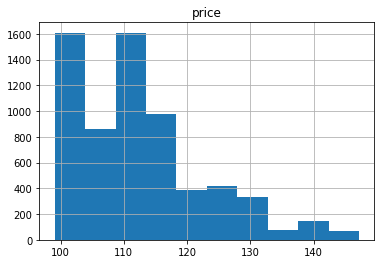

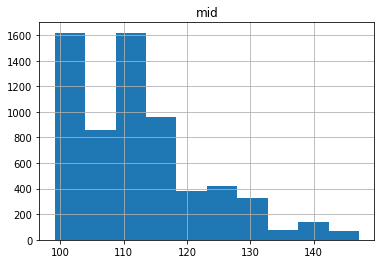

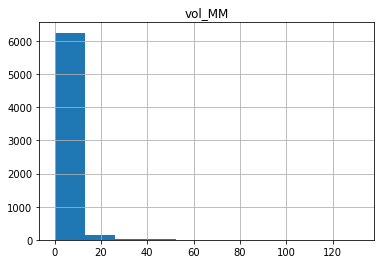

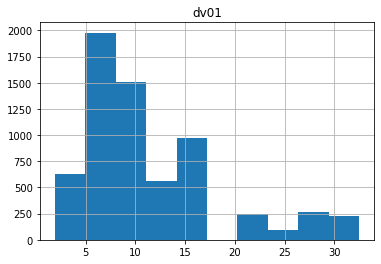

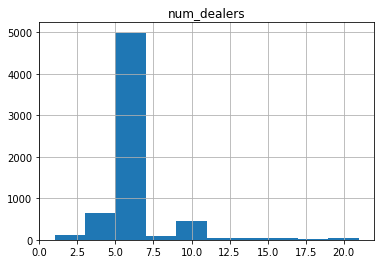

...

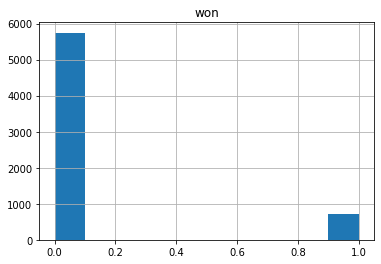

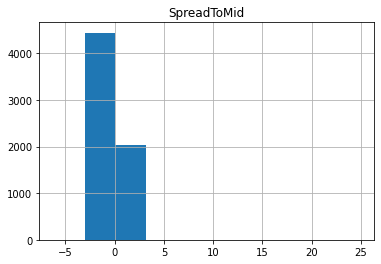

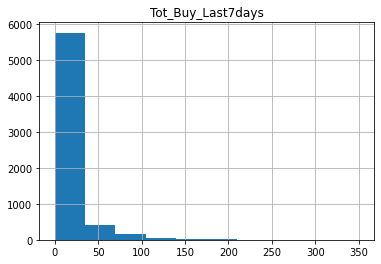

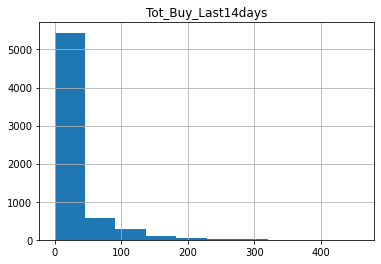

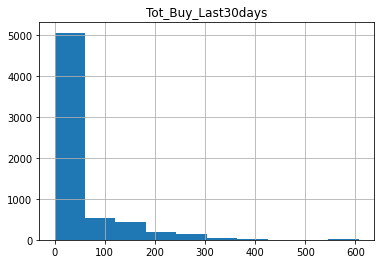

In [0]:
numerical_variables = ['price', 'mid', 'vol_MM', 'dv01', 'num_dealers', 'side', 'won', 'SpreadToMid', 'Tot_Buy_Last7days', 'Tot_Buy_Last14days', 'Tot_Buy_Last30days']
categorical_variables = ['instrument', 'client']

df_pd = df_cum_sum.toPandas()

%matplotlib inline
for i in numerical_variables:
  df_pd.hist(column=i)

### Check outliers

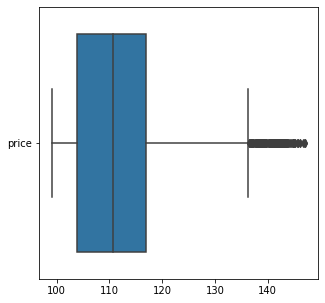

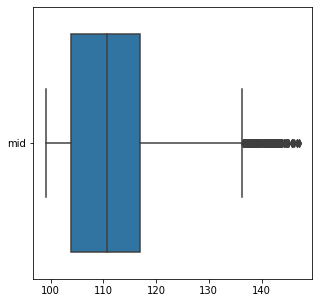

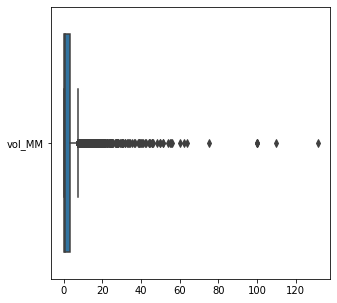

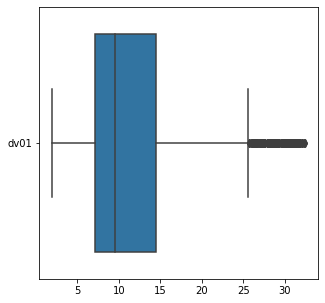

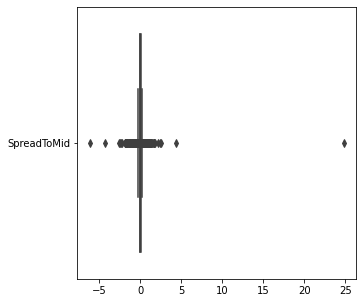

...

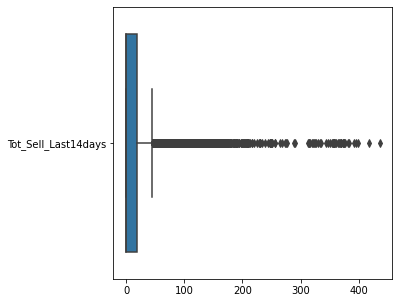

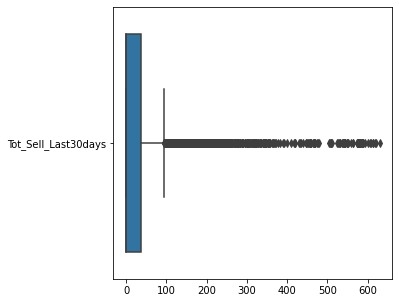

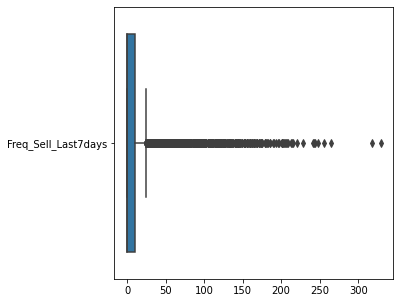

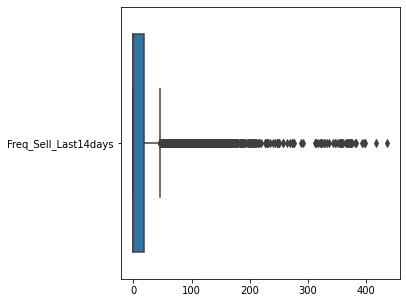

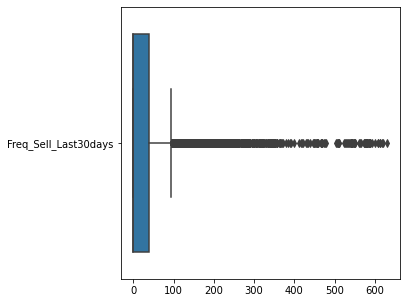

In [0]:
# df_cum_sum_boxPlot = df_cum_sum.toPandas()
# df_cum_sum_boxPlot.boxplot(column=["price",'mid','vol_MM','dv01','SpreadToMid','Tot_Buy_Last7days','Tot_Buy_Last14days','Tot_Buy_Last30days','Freq_Buy_Last7days',
#              'Freq_Buy_Last14days','Freq_Buy_Last30days','Tot_Sell_Last7days','Tot_Sell_Last14days','Tot_Sell_Last30days','Freq_Sell_Last7days',
#              'Freq_Sell_Last14days','Freq_Sell_Last30days'],by="won")

# plt.show()

columnsBoxPlot = ["price",'mid','vol_MM','dv01','SpreadToMid','Tot_Buy_Last7days','Tot_Buy_Last14days','Tot_Buy_Last30days','Freq_Buy_Last7days',
             'Freq_Buy_Last14days','Freq_Buy_Last30days','Tot_Sell_Last7days','Tot_Sell_Last14days','Tot_Sell_Last30days','Freq_Sell_Last7days',
             'Freq_Sell_Last14days','Freq_Sell_Last30days']
# df_cum_sum_boxPlot = df_cum_sum.select("price",'mid','vol_MM','dv01','SpreadToMid','Tot_Buy_Last7days','Tot_Buy_Last14days','Tot_Buy_Last30days','Freq_Buy_Last7days',
#              'Freq_Buy_Last14days','Freq_Buy_Last30days','Tot_Sell_Last7days','Tot_Sell_Last14days','Tot_Sell_Last30days','Freq_Sell_Last7days',
#              'Freq_Sell_Last14days','Freq_Sell_Last30days').toPandas()


# x = df.select(var).toPandas()
for i in columnsBoxPlot: 
  plt.figure(figsize=(5, 5))
  ax = sns.boxplot(data=df_cum_sum.select(i).toPandas(),orient='h')


because we are going to apply normalization, maybe there is no need to check this outliers

In [0]:
# Get Correlation

from sklearn.preprocessing import LabelEncoder, StandardScaler

import matplotlib.pyplot as plt
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.stat import Correlation

vector_col = "corr_features"
assembler = VectorAssembler(inputCols=variables, 
                            outputCol=vector_col)
myGraph_vector = assembler.transform(df_final).select(vector_col)
matrix = Correlation.corr(myGraph_vector, vector_col)

matrix = Correlation.corr(myGraph_vector, vector_col).collect()[0][0]
corrmatrix = matrix.toArray().tolist()
# print(corrmatrix)

df = spark.createDataFrame(corrmatrix,variables)

In [0]:
display(df)

price,mid,vol_MM,dv01,num_dealers,side,won,SpreadToMid,Tot_Buy_Last7days,Tot_Buy_Last14days,Tot_Buy_Last30days,Freq_Buy_Last7days,Freq_Buy_Last14days,Freq_Buy_Last30days,Tot_Sell_Last7days,Tot_Sell_Last14days,Tot_Sell_Last30days,Freq_Sell_Last7days,Freq_Sell_Last14days,Freq_Sell_Last30days
1,0.9953036751989376,-0.12893838782128725,0.6269285445860019,-0.027423406703671733,0.03174846332944593,-0.016915751647241642,0.021036463543874367,-0.07949214114455914,-0.07340558505703162,-0.043039529049702256,0.13498349007786112,0.15129344610192502,0.18133705980416273,-0.08962367541617673,-0.08758824379286662,-0.07828115589232092,-0.08962367541617673,-0.08758824379286662,-0.07828115589232092
0.9953036751989376,1,-0.13248827434877392,0.6298469598836168,-0.02539613035192794,0.03824250292280755,-0.015958340444431965,0.03917560919711122,-0.08249304634134536,-0.07631495866264135,-0.046115117276877775,0.13103294041535735,0.14710320206369898,0.17662280352251528,-0.0866166217933278,-0.08420420389426951,-0.07478716959230237,-0.0866166217933278,-0.08420420389426951,-0.07478716959230237
-0.12893838782128725,-0.13248827434877392,1,-0.10136374036686396,-0.21487724927957677,0.045412297585629126,0.0946730657940276,-0.008870069169233155,0.2331703565185195,0.1812676090360516,0.13175453783553998,-0.013167649710106394,-0.015597891924056497,-0.02162826523880307,0.2951540481140249,0.25099507910713087,0.22018792772185233,0.2951540481140249,0.25099507910713087,0.22018792772185233
0.6269285445860019,0.6298469598836168,-0.10136374036686396,1,-0.11070129048763533,0.002586058270317769,-0.016763993052235603,0.02697172040112242,-0.039128454330419775,-0.0275523755639716,-0.005514387878864981,0.1723745002322462,0.1867611027576512,0.20260631988303537,-0.05964894219789509,-0.05131525807191433,-0.04530028431867837,-0.05964894219789509,-0.05131525807191433,-0.04530028431867837
-0.027423406703671733,-0.02539613035192794,-0.21487724927957677,-0.11070129048763533,1,-0.03234795092185768,-0.10624100635203275,0.006644397497524967,-0.10186929239406668,-0.10452026014442592,-0.1207407049522015,-0.053162003572372614,-0.07605447621114207,-0.09834064307837141,-0.14199706417268135,-0.13866012486632587,-0.14421582095774868,-0.14199706417268135,-0.13866012486632587,-0.14421582095774868
0.03174846332944593,0.03824250292280755,0.045412297585629126,0.002586058270317769,-0.03234795092185768,1,0.03430257146684438,-0.01839501973292364,-0.3979287264283395,-0.4350530884402846,-0.4799034063930305,-0.6665244219362308,-0.6645427366651352,-0.6571475726936824,0.4472556635305764,0.47812070901860354,0.506750330774151,0.4472556635305764,0.47812070901860354,0.506750330774151
-0.016915751647241642,-0.015958340444431965,0.0946730657940276,-0.016763993052235603,-0.10624100635203275,0.03430257146684438,1,-0.03246734511971482,0.009208349377081327,0.0085617943347525,0.003752502761615028,-0.019948286939978143,-0.011915771050102915,-0.01104952813052701,0.07237118021491755,0.06242795061395235,0.07172709724948603,0.07237118021491755,0.06242795061395235,0.07172709724948603
0.021036463543874367,0.03917560919711122,-0.008870069169233155,0.02697172040112242,0.006644397497524967,-0.01839501973292364,-0.03246734511971482,1,-0.007255362293625401,-0.010805880207511586,-0.01022482052670244,-0.006588781524423788,-0.006744932228158861,-0.0044979313885904,-0.0018167546534173084,-0.007176681294872005,-0.013407723788397208,-0.0018167546534173084,-0.007176681294872005,-0.013407723788397208
-0.07949214114455914,-0.08249304634134536,0.2331703565185195,-0.039128454330419775,-0.10186929239406668,-0.3979287264283395,0.009208349377081327,-0.007255362293625401,1,0.9218414992192977,0.8045392494105938,0.6326521384103927,0.5814817329262071,0.5355421208615764,-0.17797587657658,-0.190257964818791,-0.201650513742091,-0.17797587657658,-0.190257964818791,-0.201650513742091
-0.07340558505703162,-0.07631495866264135,0.1812676090360516,-0.0275523755639716,-0.10452026014442592,-0.4350530884402846,0.0085617943347525,-0.010805880207511586,0.9218414992

#### Check dataset distribution of target variable

In [0]:
# We have an imbalanced dataset.
display(df_cum_sum.groupBy("won").agg(count("won")))

won,count(won)
1,729
0,5746


### We have to apply samplyng technique, in this case oversampling.

In [0]:
major_df = df_cum_sum.filter(col("won") == 0)
minor_df = df_cum_sum.filter(col("won") == 1)
ratio = int(major_df.count()/minor_df.count())
print("ratio: {}".format(ratio))

ratio: 7

In [0]:
a = range(ratio)

# duplicate the minority rows
oversampled_df = minor_df.withColumn("dummy", explode(array([lit(x) for x in a]))).drop('dummy')

# combine both oversampled minority rows and previous majority rows 
combined_df = major_df.unionAll(oversampled_df)
display(combined_df)


date_time_RfQ,instrument,client,price,mid,vol_MM,dv01,num_dealers,side,won,date,hour,dayOfWeek,dayOfMonth,date_time,lastMarktMid,SpreadToMid,Tot_Buy_Last7days,Tot_Buy_Last14days,Tot_Buy_Last30days,Freq_Buy_Last7days,Freq_Buy_Last14days,Freq_Buy_Last30days,Tot_Sell_Last7days,Tot_Sell_Last14days,Tot_Sell_Last30days,Freq_Sell_Last7days,Freq_Sell_Last14days,Freq_Sell_Last30days
2019-01-25T08:03:15.000+0000,A,A,101.503,101.4839,4.59,8.9921,15,-1,0,2019-01-25,8,6,25,2019-01-25T07:59:58.000+0000,101.441,0.06199646,4.590000152587891,4.590000152587891,4.590000152587891,1,1,1,0.0,0.0,0.0,0.0,0.0,0.0
2019-01-25T09:11:51.000+0000,A,A,101.73,101.664,5.0,9.0104,5,-1,0,2019-01-25,9,6,25,2019-01-25T09:09:59.000+0000,101.703,0.027000427,9.59000015258789,9.59000015258789,9.59000015258789,2,2,2,0.0,0.0,0.0,0.0,0.0,0.0
2019-01-25T11:42:12.000+0000,A,A,101.641,101.6639,19.0,9.0099,3,1,0,2019-01-25,11,6,25,2019-01-25T11:24:59.000+0000,101.678,0.037002563,0.0,0.0,0.0,0,0,0,28.59000015258789,28.59000015258789,28.59000015258789,28.59000015258789,28.59000015258789,28.59000015258789
2019-01-25T16:11:33.000+0000,A,A,101.486,101.4914,0.1,8.9918,5,-1,0,2019-01-25,16,6,25,2019-01-25T14:14:59.000+0000,101.498,-0.012001038,28.690000154078007,28.690000154078007,28.690000154078007,4,4,4,0.0,0.0,0.0,0.0,0.0,0.0
2019-01-28T14:54:49.000+0000,A,A,101.474,101.4817,9.5,8.9895,5,1,0,2019-01-28,14,2,28,2019-01-28T14:39:59.000+0000,101.491,0.016998291,0.0,0.0,0.0,0,0,0,54.19000015407801,54.19000015407801,54.19000015407801,54.19000015407801,54.19000015407801,54.19000015407801
2019-01-29T11:56:20.000+0000,A,A,101.54,101.5428,7.9,8.9932,5,1,0,2019-01-29,11,3,29,2019-01-29T11:24:59.000+0000,101.53,-0.010002136,0.0,0.0,0.0,0,0,0,62.09000024944544,62.09000024944544,62.09000024944544,62.09000024944544,62.09000024944544,62.09000024944544
2019-01-29T13:29:08.000+0000,A,A,101.504,101.5173,8.0,8.9901,5,1,0,2019-01-29,13,3,29,2019-01-29T11:24:59.000+0000,101.53,0.026000977,0.0,0.0,0.0,0,0,0,70.09000024944544,70.09000024944544,70.09000024944544,70.09000024944544,70.09000024944544,70.09000024944544
2019-01-30T08:04:27.000+0000,A,A,101.462,101.4619,0.62,8.9836,5,-1,0,2019-01-30,8,4,30,2019-01-29T16:44:59.000+0000,101.463,-9.994507E-4,78.81000063568354,78.81000063568354,78.81000063568354,11,11,11,0.0,0.0,0.0,0.0,0.0,0.0
2019-01-30T09:28:57.000+0000,A,A,101.262,101.253,3.9,8.9624,5,1,0,2019-01-30,9,4,30,2019-01-30T08:24:59.000+0000,101.379,0.116996765,0.0,0.0,0.0,0,0,0,82.71000073105097,82.71000073105097,82.71000073105097,82.71000073105097,82.71000073105097,82.71000073105097
2019-01-31T16:01:02.000+0000,A,A,101.857,101.849,21.5,9.0146,3,1,0,2019-01-31,16,5,31,2019-01-31T14:04:59.000+0000,101.641,-0.21600342,0.0,0.0,0.0,0,0,0,119.21000073105097,119.21000073105097,119.21000073105097,119.21000073105097,119.21000073105097,119.21000073105097


In [0]:
# now we have a balanced dataset !

display(combined_df.groupBy("won").agg(count("won")))

won,count(won)
0,5746
1,5103


# Modeling

In [0]:
from pyspark.ml.feature import StringIndexer

In [0]:
indexer = StringIndexer(inputCol="client", outputCol="clientIndex")
indexed = indexer.fit(combined_df).transform(combined_df) 
display(indexed.select(["client",'clientIndex']).distinct())

client,clientIndex
C,5.0
F,4.0
G,3.0
B,1.0
A,0.0
D,2.0


In [0]:
indexer = StringIndexer(inputCol="instrument", outputCol="instrumentIndex")
indexed = indexer.fit(indexed).transform(indexed) 
display(indexed.select(["instrument",'instrumentIndex']).distinct())

instrument,instrumentIndex
J,10.0
G,9.0
B,0.0
H,6.0
L,8.0
K,11.0
F,5.0
D,3.0
E,4.0
C,1.0


In [0]:
# Import VectorAssembler and Vectors
from pyspark.ml.linalg import Vectors
from pyspark.ml.feature import VectorAssembler

assembler = VectorAssembler(
  inputCols=['clientIndex','instrumentIndex',
             'price','mid',
             'vol_MM','dv01',
             'num_dealers','side',
             'SpreadToMid',
             'Tot_Buy_Last7days','Tot_Buy_Last14days',
             'Tot_Buy_Last30days','Freq_Buy_Last7days',
             'Freq_Buy_Last14days','Freq_Buy_Last30days',
             'Tot_Sell_Last7days','Tot_Sell_Last14days',
             'Tot_Sell_Last30days','Freq_Sell_Last7days',
             'Freq_Sell_Last14days','Freq_Sell_Last30days'],
              outputCol="features")

In [0]:
# create an extra column "features" with column vectorized
output = assembler.transform(indexed)

In [0]:
display(output)

date_time_RfQ,instrument,client,price,mid,vol_MM,dv01,num_dealers,side,won,date,hour,dayOfWeek,dayOfMonth,date_time,lastMarktMid,SpreadToMid,Tot_Buy_Last7days,Tot_Buy_Last14days,Tot_Buy_Last30days,Freq_Buy_Last7days,Freq_Buy_Last14days,Freq_Buy_Last30days,Tot_Sell_Last7days,Tot_Sell_Last14days,Tot_Sell_Last30days,Freq_Sell_Last7days,Freq_Sell_Last14days,Freq_Sell_Last30days,clientIndex,instrumentIndex,features
2019-01-25T08:03:15.000+0000,A,A,101.503,101.4839,4.59,8.9921,15,-1,0,2019-01-25,8,6,25,2019-01-25T07:59:58.000+0000,101.441,0.06199646,4.590000152587891,4.590000152587891,4.590000152587891,1,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,"Map(vectorType -> dense, length -> 21, values -> List(0.0, 2.0, 101.50299835205078, 101.48390197753906, 4.590000152587891, 8.9921, 15.0, -1.0, 0.0619964599609375, 4.590000152587891, 4.590000152587891, 4.590000152587891, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0))"
2019-01-25T09:11:51.000+0000,A,A,101.73,101.664,5.0,9.0104,5,-1,0,2019-01-25,9,6,25,2019-01-25T09:09:59.000+0000,101.703,0.027000427,9.59000015258789,9.59000015258789,9.59000015258789,2,2,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,"Map(vectorType -> dense, length -> 21, values -> List(0.0, 2.0, 101.7300033569336, 101.66400146484375, 5.0, 9.0104, 5.0, -1.0, 0.02700042724609375, 9.59000015258789, 9.59000015258789, 9.59000015258789, 2.0, 2.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0))"
2019-01-25T11:42:12.000+0000,A,A,101.641,101.6639,19.0,9.0099,3,1,0,2019-01-25,11,6,25,2019-01-25T11:24:59.000+0000,101.678,0.037002563,0.0,0.0,0.0,0,0,0,28.59000015258789,28.59000015258789,28.59000015258789,28.59000015258789,28.59000015258789,28.59000015258789,0.0,2.0,"Map(vectorType -> dense, length -> 21, values -> List(0.0, 2.0, 101.64099884033203, 101.66390228271484, 19.0, 9.0099, 3.0, 1.0, 0.0370025634765625, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 28.59000015258789, 28.59000015258789, 28.59000015258789, 28.59000015258789, 28.59000015258789, 28.59000015258789))"
2019-01-25T16:11:33.000+0000,A,A,101.486,101.4914,0.1,8.9918,5,-1,0,2019-01-25,16,6,25,2019-01-25T14:14:59.000+0000,101.498,-0.012001038,28.690000154078007,28.690000154078007,28.690000154078007,4,4,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,"Map(vectorType -> dense, length -> 21, values -> List(0.0, 2.0, 101.48600006103516, 101.49140167236328, 0.10000000149011612, 8.9918, 5.0, -1.0, -0.01200103759765625, 28.690000154078007, 28.690000154078007, 28.690000154078007, 4.0, 4.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0))"
2019-01-28T14:54:49.000+0000,A,A,101.474,101.4817,9.5,8.9895,5,1,0,2019-01-28,14,2,28,2019-01-28T14:39:59.000+0000,101.491,0.016998291,0.0,0.0,0.0,0,0,0,54.19000015407801,54.19000015407801,54.19000015407801,54.19000015407801,54.19000015407801,54.19000015407801,0.0,2.0,"Map(vectorType -> dense, length -> 21, values -> List(0.0, 2.0, 101.4739990234375, 101.48169708251953, 9.5, 8.9895, 5.0, 1.0, 0.016998291015625, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 54.19000015407801, 54.19000015407801, 54.19000015407801, 54.19000015407801, 54.19000015407801, 54.19000015407801))"
2019-01-29T11:56:20.000+0000,A,A,101.54,101.5428,7.9,8.9932,5,1,0,2019-01-29,11,3,29,2019-01-29T11:24:59.000+0000,101.53,-0.010002136,0.0,0.0,0.0,0,0,0,62.09000024944544,62.09000024944544,62.09000024944544,62.09000024944544,62.09000024944544,62.09000024944544,0.0,2.0,"Map(vectorType -> dense, length -> 21, values -> List(0.0, 2.0, 101.54000091552734, 101.54280090332031, 7.900000095367432, 8.9932, 5.0, 1.0, -0.01000213623046875, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 62.09000024944544, 62.09000024944544, 62.09000024944544, 62.09000024944544, 62.09000024944544, 62.09000024944544))"
2019-01-29T13:29:08.000+0000,A,A,101.504,101.5173,8.0,8.9901,5,1,0,2019-01-29,13,3,29,2019-01-29T11:24:59.000+0000,101.53,0.026000977,0.0,0.0,0.0,0,0,0,70.09000024944544,70.09000024944544,70.09000024944544,70.09000024944544,70.09000024944544,70.09000024944544,0.0,2.0,"Map(vectorType -> dense, length -> 21, values -> List(0.0, 2.0, 101.50399780273438, 101.51730346679688, 8.0, 8.9901, 5.0, 1.0, 0.0260009765

In [0]:
display(output)

date_time_RfQ,instrument,client,price,mid,vol_MM,dv01,num_dealers,side,won,date,hour,dayOfWeek,dayOfMonth,date_time,lastMarktMid,SpreadToMid,Tot_Buy_Last7days,Tot_Buy_Last14days,Tot_Buy_Last30days,Freq_Buy_Last7days,Freq_Buy_Last14days,Freq_Buy_Last30days,Tot_Sell_Last7days,Tot_Sell_Last14days,Tot_Sell_Last30days,Freq_Sell_Last7days,Freq_Sell_Last14days,Freq_Sell_Last30days,clientIndex,instrumentIndex,features
2019-01-25T08:03:15.000+0000,A,A,101.503,101.4839,4.59,8.9921,15,-1,0,2019-01-25,8,6,25,2019-01-25T07:59:58.000+0000,101.441,0.06199646,4.590000152587891,4.590000152587891,4.590000152587891,1,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,"Map(vectorType -> dense, length -> 21, values -> List(0.0, 2.0, 101.50299835205078, 101.48390197753906, 4.590000152587891, 8.9921, 15.0, -1.0, 0.0619964599609375, 4.590000152587891, 4.590000152587891, 4.590000152587891, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0))"
2019-01-25T09:11:51.000+0000,A,A,101.73,101.664,5.0,9.0104,5,-1,0,2019-01-25,9,6,25,2019-01-25T09:09:59.000+0000,101.703,0.027000427,9.59000015258789,9.59000015258789,9.59000015258789,2,2,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,"Map(vectorType -> dense, length -> 21, values -> List(0.0, 2.0, 101.7300033569336, 101.66400146484375, 5.0, 9.0104, 5.0, -1.0, 0.02700042724609375, 9.59000015258789, 9.59000015258789, 9.59000015258789, 2.0, 2.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0))"
2019-01-25T11:42:12.000+0000,A,A,101.641,101.6639,19.0,9.0099,3,1,0,2019-01-25,11,6,25,2019-01-25T11:24:59.000+0000,101.678,0.037002563,0.0,0.0,0.0,0,0,0,28.59000015258789,28.59000015258789,28.59000015258789,28.59000015258789,28.59000015258789,28.59000015258789,0.0,2.0,"Map(vectorType -> dense, length -> 21, values -> List(0.0, 2.0, 101.64099884033203, 101.66390228271484, 19.0, 9.0099, 3.0, 1.0, 0.0370025634765625, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 28.59000015258789, 28.59000015258789, 28.59000015258789, 28.59000015258789, 28.59000015258789, 28.59000015258789))"
2019-01-25T16:11:33.000+0000,A,A,101.486,101.4914,0.1,8.9918,5,-1,0,2019-01-25,16,6,25,2019-01-25T14:14:59.000+0000,101.498,-0.012001038,28.690000154078007,28.690000154078007,28.690000154078007,4,4,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,"Map(vectorType -> dense, length -> 21, values -> List(0.0, 2.0, 101.48600006103516, 101.49140167236328, 0.10000000149011612, 8.9918, 5.0, -1.0, -0.01200103759765625, 28.690000154078007, 28.690000154078007, 28.690000154078007, 4.0, 4.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0))"
2019-01-28T14:54:49.000+0000,A,A,101.474,101.4817,9.5,8.9895,5,1,0,2019-01-28,14,2,28,2019-01-28T14:39:59.000+0000,101.491,0.016998291,0.0,0.0,0.0,0,0,0,54.19000015407801,54.19000015407801,54.19000015407801,54.19000015407801,54.19000015407801,54.19000015407801,0.0,2.0,"Map(vectorType -> dense, length -> 21, values -> List(0.0, 2.0, 101.4739990234375, 101.48169708251953, 9.5, 8.9895, 5.0, 1.0, 0.016998291015625, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 54.19000015407801, 54.19000015407801, 54.19000015407801, 54.19000015407801, 54.19000015407801, 54.19000015407801))"
2019-01-29T11:56:20.000+0000,A,A,101.54,101.5428,7.9,8.9932,5,1,0,2019-01-29,11,3,29,2019-01-29T11:24:59.000+0000,101.53,-0.010002136,0.0,0.0,0.0,0,0,0,62.09000024944544,62.09000024944544,62.09000024944544,62.09000024944544,62.09000024944544,62.09000024944544,0.0,2.0,"Map(vectorType -> dense, length -> 21, values -> List(0.0, 2.0, 101.54000091552734, 101.54280090332031, 7.900000095367432, 8.9932, 5.0, 1.0, -0.01000213623046875, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 62.09000024944544, 62.09000024944544, 62.09000024944544, 62.09000024944544, 62.09000024944544, 62.09000024944544))"
2019-01-29T13:29:08.000+0000,A,A,101.504,101.5173,8.0,8.9901,5,1,0,2019-01-29,13,3,29,2019-01-29T11:24:59.000+0000,101.53,0.026000977,0.0,0.0,0.0,0,0,0,70.09000024944544,70.09000024944544,70.09000024944544,70.09000024944544,70.09000024944544,70.09000024944544,0.0,2.0,"Map(vectorType -> dense, length -> 21, values -> List(0.0, 2.0, 101.50399780273438, 101.51730346679688, 8.0, 8.9901, 5.0, 1.0, 0.0260009765

In [0]:
# Fits a model to the input dataset with optional parameters.

indexer = StringIndexer(inputCol="won", outputCol="wonIndex")
output_fixed = indexer.fit(output).transform(output)

In [0]:
display(output_fixed)

date_time_RfQ,instrument,client,price,mid,vol_MM,dv01,num_dealers,side,won,date,hour,dayOfWeek,dayOfMonth,date_time,lastMarktMid,SpreadToMid,Tot_Buy_Last7days,Tot_Buy_Last14days,Tot_Buy_Last30days,Freq_Buy_Last7days,Freq_Buy_Last14days,Freq_Buy_Last30days,Tot_Sell_Last7days,Tot_Sell_Last14days,Tot_Sell_Last30days,Freq_Sell_Last7days,Freq_Sell_Last14days,Freq_Sell_Last30days,clientIndex,instrumentIndex,features,wonIndex
2019-01-25T08:03:15.000+0000,A,A,101.503,101.4839,4.59,8.9921,15,-1,0,2019-01-25,8,6,25,2019-01-25T07:59:58.000+0000,101.441,0.06199646,4.590000152587891,4.590000152587891,4.590000152587891,1,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,"Map(vectorType -> dense, length -> 21, values -> List(0.0, 2.0, 101.50299835205078, 101.48390197753906, 4.590000152587891, 8.9921, 15.0, -1.0, 0.0619964599609375, 4.590000152587891, 4.590000152587891, 4.590000152587891, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0))",0.0
2019-01-25T09:11:51.000+0000,A,A,101.73,101.664,5.0,9.0104,5,-1,0,2019-01-25,9,6,25,2019-01-25T09:09:59.000+0000,101.703,0.027000427,9.59000015258789,9.59000015258789,9.59000015258789,2,2,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,"Map(vectorType -> dense, length -> 21, values -> List(0.0, 2.0, 101.7300033569336, 101.66400146484375, 5.0, 9.0104, 5.0, -1.0, 0.02700042724609375, 9.59000015258789, 9.59000015258789, 9.59000015258789, 2.0, 2.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0))",0.0
2019-01-25T11:42:12.000+0000,A,A,101.641,101.6639,19.0,9.0099,3,1,0,2019-01-25,11,6,25,2019-01-25T11:24:59.000+0000,101.678,0.037002563,0.0,0.0,0.0,0,0,0,28.59000015258789,28.59000015258789,28.59000015258789,28.59000015258789,28.59000015258789,28.59000015258789,0.0,2.0,"Map(vectorType -> dense, length -> 21, values -> List(0.0, 2.0, 101.64099884033203, 101.66390228271484, 19.0, 9.0099, 3.0, 1.0, 0.0370025634765625, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 28.59000015258789, 28.59000015258789, 28.59000015258789, 28.59000015258789, 28.59000015258789, 28.59000015258789))",0.0
2019-01-25T16:11:33.000+0000,A,A,101.486,101.4914,0.1,8.9918,5,-1,0,2019-01-25,16,6,25,2019-01-25T14:14:59.000+0000,101.498,-0.012001038,28.690000154078007,28.690000154078007,28.690000154078007,4,4,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,"Map(vectorType -> dense, length -> 21, values -> List(0.0, 2.0, 101.48600006103516, 101.49140167236328, 0.10000000149011612, 8.9918, 5.0, -1.0, -0.01200103759765625, 28.690000154078007, 28.690000154078007, 28.690000154078007, 4.0, 4.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0))",0.0
2019-01-28T14:54:49.000+0000,A,A,101.474,101.4817,9.5,8.9895,5,1,0,2019-01-28,14,2,28,2019-01-28T14:39:59.000+0000,101.491,0.016998291,0.0,0.0,0.0,0,0,0,54.19000015407801,54.19000015407801,54.19000015407801,54.19000015407801,54.19000015407801,54.19000015407801,0.0,2.0,"Map(vectorType -> dense, length -> 21, values -> List(0.0, 2.0, 101.4739990234375, 101.48169708251953, 9.5, 8.9895, 5.0, 1.0, 0.016998291015625, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 54.19000015407801, 54.19000015407801, 54.19000015407801, 54.19000015407801, 54.19000015407801, 54.19000015407801))",0.0
2019-01-29T11:56:20.000+0000,A,A,101.54,101.5428,7.9,8.9932,5,1,0,2019-01-29,11,3,29,2019-01-29T11:24:59.000+0000,101.53,-0.010002136,0.0,0.0,0.0,0,0,0,62.09000024944544,62.09000024944544,62.09000024944544,62.09000024944544,62.09000024944544,62.09000024944544,0.0,2.0,"Map(vectorType -> dense, length -> 21, values -> List(0.0, 2.0, 101.54000091552734, 101.54280090332031, 7.900000095367432, 8.9932, 5.0, 1.0, -0.01000213623046875, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 62.09000024944544, 62.09000024944544, 62.09000024944544, 62.09000024944544, 62.09000024944544, 62.09000024944544))",0.0
2019-01-29T13:29:08.000+0000,A,A,101.504,101.5173,8.0,8.9901,5,1,0,2019-01-29,13,3,29,2019-01-29T11:24:59.000+0000,101.53,0.026000977,0.0,0.0,0.0,0,0,0,70.09000024944544,70.09000024944544,70.09000024944544,70.09000024944544,70.09000024944544,70.09000024944544,0.0,2.0,"Map(vectorType -> dense, length -> 21, values -> List(0.0, 2.0, 101.50399780273438, 101.51730346679688, 8.

In [0]:
final_data = output_fixed.select("features",'wonIndex')

In [0]:
final_data.show()

+--------------------+--------+
 features|wonIndex|
+--------------------+--------+
[0.0,2.0,101.5029...| 0.0|
[0.0,2.0,101.7300...| 0.0|
[0.0,2.0,101.6409...| 0.0|
[0.0,2.0,101.4860...| 0.0|
[0.0,2.0,101.4739...| 0.0|
[0.0,2.0,101.5400...| 0.0|
[0.0,2.0,101.5039...| 0.0|
[0.0,2.0,101.4619...| 0.0|
[0.0,2.0,101.2620...| 0.0|
[0.0,2.0,101.8570...| 0.0|
[0.0,2.0,101.8509...| 0.0|
[0.0,2.0,101.8809...| 0.0|
[0.0,2.0,101.8560...| 0.0|
[0.0,2.0,101.7279...| 0.0|
[0.0,2.0,101.4380...| 0.0|
[0.0,2.0,101.7389...| 0.0|
[0.0,2.0,101.6750...| 0.0|
[0.0,2.0,101.4860...| 0.0|
[0.0,2.0,101.3820...| 0.0|
[0.0,2.0,101.3779...| 0.0|
+--------------------+--------+
only showing top 20 rows

In [0]:
train_data,test_data = final_data.randomSplit([0.7,0.3])

In [0]:
display((train_data))

features,wonIndex
"Map(vectorType -> dense, length -> 21, values -> List(0.0, 0.0, 104.63400268554688, 104.53739929199219, 1.0, 21.4467, 5.0, -1.0, -0.11100006103515625, 9.183999925851822, 30.02199975773692, 51.37199987843633, 8.0, 21.0, 34.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0))",0.0
"Map(vectorType -> dense, length -> 21, values -> List(0.0, 0.0, 105.01000213623047, 105.29019927978516, 1.0, 21.6738, 5.0, 1.0, 0.5989990234375, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 20.250000096857548, 20.250000096857548, 20.250000096857548, 20.250000096857548, 20.250000096857548, 20.250000096857548))",0.0
"Map(vectorType -> dense, length -> 21, values -> List(0.0, 0.0, 105.14199829101562, 105.15290069580078, 1.5, 21.6163, 6.0, -1.0, -0.27700042724609375, 17.49999988079071, 38.850000001490116, 38.850000001490116, 9.0, 22.0, 22.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0))",0.0
"Map(vectorType -> dense, length -> 21, values -> List(0.0, 0.0, 105.16200256347656, 105.24690246582031, 2.8499999046325684, 21.6122, 6.0, 1.0, -0.0500030517578125, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 22.47599971294403, 34.58199970796704, 64.60399946570396, 22.47599971294403, 34.58199970796704, 64.60399946570396))",0.0
"Map(vectorType -> dense, length -> 21, values -> List(0.0, 0.0, 105.16699981689453, 105.27989959716797, 2.75, 21.6209, 6.0, 1.0, 0.2519989013671875, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 19.625999808311462, 31.731999803334475, 61.753999561071396, 19.625999808311462, 31.731999803334475, 61.753999561071396))",0.0
"Map(vectorType -> dense, length -> 21, values -> List(0.0, 0.0, 105.19400024414062, 105.10880279541016, 2.0, 21.6, 6.0, -1.0, 0.0749969482421875, 10.778000067919493, 23.37799985334277, 44.72799997404218, 8.0, 15.0, 28.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0))",0.0
"Map(vectorType -> dense, length -> 21, values -> List(0.0, 0.0, 105.2699966430664, 105.38289642333984, 1.5, 21.6479, 6.0, 1.0, 0.10300445556640625, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.875999808311462, 28.981999803334475, 59.003999561071396, 16.875999808311462, 28.981999803334475, 59.003999561071396))",0.0
"Map(vectorType -> dense, length -> 21, values -> List(0.0, 0.0, 105.34100341796875, 105.25789642333984, 0.75, 21.6478, 5.0, -1.0, -0.07799530029296875, 19.549999833106995, 40.8999999538064, 40.8999999538064, 11.0, 24.0, 24.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0))",0.0
"Map(vectorType -> dense, length -> 21, values -> List(0.0, 0.0, 105.37899780273438, 105.42990112304688, 0.5, 21.6813, 5.0, 1.0, 0.05100250244140625, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 11.02199987694621, 28.52199975773692, 49.87199987843633, 11.02199987694621, 28.52199975773692, 49.87199987843633))",0.0
"Map(vectorType -> dense, length -> 21, values -> List(0.0, 0.0, 105.4229965209961, 105.50340270996094, 1.0, 21.6953, 5.0, 1.0, 0.03600311279296875, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 10.183999925851822, 21.02199987694621, 52.37199987843633, 10.183999925851822, 21.02199987694621, 52.37199987843633))",0.0


### The Classifiers

In [0]:
from pyspark.ml.classification import DecisionTreeClassifier,GBTClassifier,RandomForestClassifier
from pyspark.ml import Pipeline

Create all three models:

In [0]:
# Use mostly defaults to make this comparison "fair"

dtc = DecisionTreeClassifier(labelCol='wonIndex',featuresCol='features')
rfc = RandomForestClassifier(labelCol='wonIndex',featuresCol='features')
gbt = GBTClassifier(labelCol='wonIndex',featuresCol='features')

Train all three models:

In [0]:
# Train the models (its three models, so it might take some time)
dtc_model = dtc.fit(train_data)
rfc_model = rfc.fit(train_data)
gbt_model = gbt.fit(train_data)

## Model Comparison

Let's compare each of these models!

In [0]:
dtc_predictions = dtc_model.transform(test_data)
rfc_predictions = rfc_model.transform(test_data)
gbt_predictions = gbt_model.transform(test_data)

**Evaluation Metrics:**

In [0]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

In [0]:
# Select (prediction, true label) and compute test error
acc_evaluator = MulticlassClassificationEvaluator(labelCol="wonIndex", predictionCol="prediction", metricName="accuracy")

In [0]:
dtc_acc = acc_evaluator.evaluate(dtc_predictions)
rfc_acc = acc_evaluator.evaluate(rfc_predictions)
gbt_acc = acc_evaluator.evaluate(gbt_predictions)

In [0]:
print("Here are the results!")
print('-'*80)
print('A single decision tree had an accuracy of: {0:2.2f}%'.format(dtc_acc*100))
print('-'*80)
print('A random forest ensemble had an accuracy of: {0:2.2f}%'.format(rfc_acc*100))
print('-'*80)
print('A ensemble using GBT had an accuracy of: {0:2.2f}%'.format(gbt_acc*100))

Here are the results!
--------------------------------------------------------------------------------
A single decision tree had an accuracy of: 61.25%
--------------------------------------------------------------------------------
A random forest ensemble had an accuracy of: 65.55%
--------------------------------------------------------------------------------
A ensemble using GBT had an accuracy of: 72.16%

In [0]:
y_true = dtc_predictions.select(['wonIndex']).collect()
y_pred = dtc_predictions.select(['prediction']).collect()

print("#1 Single decision tree Matrix: ")
print(classification_report(y_true, y_pred))

#1 Single decision tree Matrix: 
 precision recall f1-score support

 0.0 0.72 0.46 0.56 1691
 1.0 0.56 0.79 0.66 1470

 accuracy 0.61 3161
 macro avg 0.64 0.62 0.61 3161
weighted avg 0.64 0.61 0.60 3161

In [0]:
y_true = rfc_predictions.select(['wonIndex']).collect()
y_pred = rfc_predictions.select(['prediction']).collect()

print("#2 Random forest ensemble Matrix: ")
print(classification_report(y_true, y_pred))

#2 Random forest ensemble Matrix: 
 precision recall f1-score support

 0.0 0.65 0.77 0.70 1691
 1.0 0.66 0.53 0.59 1470

 accuracy 0.66 3161
 macro avg 0.66 0.65 0.65 3161
weighted avg 0.66 0.66 0.65 3161

In [0]:
y_true = gbt_predictions.select(['wonIndex']).collect()
y_pred = gbt_predictions.select(['prediction']).collect()

print("#3 GBT  Matrix: ")
print(classification_report(y_true, y_pred))

#3 GBT Matrix: 
 precision recall f1-score support

 0.0 0.76 0.71 0.73 1691
 1.0 0.69 0.74 0.71 1470

 accuracy 0.72 3161
 macro avg 0.72 0.72 0.72 3161
weighted avg 0.72 0.72 0.72 3161

#### Check ROC values

In [0]:
# Let's use the run-of-the-mill evaluator
evaluator = BinaryClassificationEvaluator(labelCol='wonIndex')

# We have only two choices: area under ROC and PR curves :-(
auroc = evaluator.evaluate(dtc_predictions, {evaluator.metricName: "areaUnderROC"})
auprc = evaluator.evaluate(dtc_predictions, {evaluator.metricName: "areaUnderPR"})
print("Single decision tree ROC:")
print("Area under ROC Curve: {:.4f}".format(auroc))
print("Area under PR Curve: {:.4f}".format(auprc))

auroc = evaluator.evaluate(rfc_predictions, {evaluator.metricName: "areaUnderROC"})
auprc = evaluator.evaluate(rfc_predictions, {evaluator.metricName: "areaUnderPR"})
print("\nRandom forest ensemble ROC:")
print("Area under ROC Curve: {:.4f}".format(auroc))
print("Area under PR Curve: {:.4f}".format(auprc))

auroc = evaluator.evaluate(gbt_predictions, {evaluator.metricName: "areaUnderROC"})
auprc = evaluator.evaluate(gbt_predictions, {evaluator.metricName: "areaUnderPR"})
print("\nGBT ROC:")
print("Area under ROC Curve: {:.4f}".format(auroc))
print("Area under PR Curve: {:.4f}".format(auprc))


Single decision tree ROC:
Area under ROC Curve: 0.5899
Area under PR Curve: 0.5216

Random forest ensemble ROC:
Area under ROC Curve: 0.7141
Area under PR Curve: 0.6882

GBT ROC:
Area under ROC Curve: 0.8060
Area under PR Curve: 0.7658

# Conclusions
- The best model is the Gradient Booster tree with only 72% of accuracy. I could test the model with accuracy parameter because I have balanced the dataset with oversampling technique.
- The model could be improved, by testing other models like NeuralNetworks, or by creating new features from our dataset related to the client's patterns.
- I enjoy developing this project, because I built an entire Data Science project, work and learn new concepts involving bonds in banks and learn how they could win more trades over time.